## Import the libraries

We'll use `pandas` to load and manipulate the data. Other libraries will be imported in the relevant sections.

In [1]:
%matplotlib inline

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

# from google.colab import drive
# drive.mount('/content/drive')

## Exploratory Data Analysis

In [2]:
dataset_path = '/kaggle/input/diabetes-readmission-prediction-i43/'

train_df = pd.read_csv(os.path.join(dataset_path, 'train.csv'))
test_df = pd.read_csv(os.path.join(dataset_path, 'test.csv'))

print("The shape of the dataset is {}.\n\n".format(train_df.shape))

train_df.head()

The shape of the dataset is (71236, 50).




,encounter_id,patient_nbr,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,...,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
0,197920182,110382426,Caucasian,Female,[80-90),?,3,1,7,5,...,No,No,No,No,No,No,No,Ch,Yes,>30
1,30870324,1276911,Caucasian,Male,[70-80),?,3,5,1,3,...,No,No,No,No,No,No,No,No,Yes,NO
2,126616944,92115693,Caucasian,Female,[70-80),?,3,3,1,8,...,No,Up,No,No,No,No,No,Ch,Yes,NO
3,303646118,32010471,Caucasian,Male,[50-60),?,6,1,7,7,...,No,No,No,No,No,No,No,No,No,>30
4,109444026,2402271,Caucasian,Male,[40-50),?,1,1,6,2,...,No,Steady,No,No,No,No,No,No,Yes,NO


In [3]:
# train_df = pd.read_csv('/content/drive/MyDrive/ITI/Competition/train.csv')
# test_df = pd.read_csv('/content/drive/MyDrive/ITI/Competition/test.csv')

# train_df.head()

Replace `?` by `NaN` value

In [4]:
train_df = train_df.replace(['?', 'Unknown/Invalid'], np.nan)
test_df = test_df.replace(['?', 'Unknown/Invalid'], np.nan)

train_df.head()

,encounter_id,patient_nbr,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,...,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
0,197920182,110382426,Caucasian,Female,[80-90),NaN,3,1,7,5,...,No,No,No,No,No,No,No,Ch,Yes,>30
1,30870324,1276911,Caucasian,Male,[70-80),NaN,3,5,1,3,...,No,No,No,No,No,No,No,No,Yes,NO
2,126616944,92115693,Caucasian,Female,[70-80),NaN,3,3,1,8,...,No,Up,No,No,No,No,No,Ch,Yes,NO
3,303646118,32010471,Caucasian,Male,[50-60),NaN,6,1,7,7,...,No,No,No,No,No,No,No,No,No,>30
4,109444026,2402271,Caucasian,Male,[40-50),NaN,1,1,6,2,...,No,Steady,No,No,No,No,No,No,Yes,NO


##### General insights

In [5]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 71236 entries, 0 to 71235
Data columns (total 50 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   encounter_id              71236 non-null  int64 
 1   patient_nbr               71236 non-null  int64 
 2   race                      69644 non-null  object
 3   gender                    71235 non-null  object
 4   age                       71236 non-null  object
 5   weight                    2209 non-null   object
 6   admission_type_id         71236 non-null  int64 
 7   discharge_disposition_id  71236 non-null  int64 
 8   admission_source_id       71236 non-null  int64 
 9   time_in_hospital          71236 non-null  int64 
 10  payer_code                43018 non-null  object
 11  medical_specialty         36249 non-null  object
 12  num_lab_procedures        71236 non-null  int64 
 13  num_procedures            71236 non-null  int64 
 14  num_medications       

We've got 71236 examples in the dataset with 48 featues, 1 ID (`encounter_id`), and the labels (`readmitted`).

By looking at the features and a sample from the data, the features are numerical and catogerical types. What about some descriptive statistics?

As shown: 
- `14` days was the longest accommodation period for a patient

- On Average, The Patient do `44` Laboratory Tests during encounter

- Patients don't have in or outpatient visits in the year preceding the encounter.

- Number of diagonses entered into the system range from 1 to 16 and it's 7 in average.

In [6]:
train_df.describe().T

,count,mean,std,min,25%,50%,75%,max
encounter_id,71236.0,1.651251e+08,1.028815e+08,12522.0,84755440.5,152436795.0,2.303751e+08,443867222.0
patient_nbr,71236.0,5.424765e+07,3.873555e+07,135.0,23409027.0,45155295.0,8.740911e+07,189351095.0
admission_type_id,71236.0,2.024679e+00,1.446816e+00,1.0,1.0,1.0,3.000000e+00,8.0
discharge_disposition_id,71236.0,3.709824e+00,5.267355e+00,1.0,1.0,1.0,3.000000e+00,28.0
admission_source_id,71236.0,5.763420e+00,4.076464e+00,1.0,1.0,7.0,7.000000e+00,25.0
time_in_hospital,71236.0,4.397861e+00,2.982953e+00,1.0,2.0,4.0,6.000000e+00,14.0
num_lab_procedures,71236.0,4.309957e+01,1.965511e+01,1.0,31.0,44.0,5.700000e+01,132.0
num_procedures,71236.0,1.337315e+00,1.705764e+00,0.0,0.0,1.0,2.000000e+00,6.0
num_medications,71236.0,1.601701e+01,8.102990e+00,1.0,10.0,15.0,2.000000e+01,81.0
number_outpatient,71236.0,3.675529e-01,1.244195e+00,0.0,0.0,0.0,0.000000e+00,40.0


Ratio of NaNs in each columns:

- almost `70%` of weight column values are NaNs

- almost `49%` of medical_specialty column values are NaNs

- almost `40%` of payer_code column values are NaNs

which will be dropped.

In [7]:
round(train_df.isnull().sum(axis=0)*100/train_df.shape[0],2)

encounter_id                 0.00
patient_nbr                  0.00
race                         2.23
gender                       0.00
age                          0.00
weight                      96.90
admission_type_id            0.00
discharge_disposition_id     0.00
admission_source_id          0.00
time_in_hospital             0.00
payer_code                  39.61
medical_specialty           49.11
num_lab_procedures           0.00
num_procedures               0.00
num_medications              0.00
number_outpatient            0.00
number_emergency             0.00
number_inpatient             0.00
diag_1                       0.02
diag_2                       0.34
diag_3                       1.42
number_diagnoses             0.00
max_glu_serum                0.00
A1Cresult                    0.00
metformin                    0.00
repaglinide                  0.00
nateglinide                  0.00
chlorpropamide               0.00
glimepiride                  0.00
acetohexamide 

Drop `weight`, `payer_code`, `medical_specialty` columns

In [8]:
train_df = train_df.drop(columns=['weight', 'payer_code', 'medical_specialty'])
test_df = test_df.drop(columns=['weight', 'payer_code', 'medical_specialty'])

In [9]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 71236 entries, 0 to 71235
Data columns (total 47 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   encounter_id              71236 non-null  int64 
 1   patient_nbr               71236 non-null  int64 
 2   race                      69644 non-null  object
 3   gender                    71235 non-null  object
 4   age                       71236 non-null  object
 5   admission_type_id         71236 non-null  int64 
 6   discharge_disposition_id  71236 non-null  int64 
 7   admission_source_id       71236 non-null  int64 
 8   time_in_hospital          71236 non-null  int64 
 9   num_lab_procedures        71236 non-null  int64 
 10  num_procedures            71236 non-null  int64 
 11  num_medications           71236 non-null  int64 
 12  number_outpatient         71236 non-null  int64 
 13  number_emergency          71236 non-null  int64 
 14  number_inpatient      

Fill NaNs with mode values

In [10]:
for column in train_df.drop(columns='readmitted').columns:
  mode_value = train_df[column].mode()[0]
  train_df[column] = train_df[column].fillna(mode_value)
  test_df[column] = test_df[column].fillna(mode_value)

round(train_df.isnull().sum(axis=0)*100/train_df.shape[0],2)

encounter_id                0.0
patient_nbr                 0.0
race                        0.0
gender                      0.0
age                         0.0
admission_type_id           0.0
discharge_disposition_id    0.0
admission_source_id         0.0
time_in_hospital            0.0
num_lab_procedures          0.0
num_procedures              0.0
num_medications             0.0
number_outpatient           0.0
number_emergency            0.0
number_inpatient            0.0
diag_1                      0.0
diag_2                      0.0
diag_3                      0.0
number_diagnoses            0.0
max_glu_serum               0.0
A1Cresult                   0.0
metformin                   0.0
repaglinide                 0.0
nateglinide                 0.0
chlorpropamide              0.0
glimepiride                 0.0
acetohexamide               0.0
glipizide                   0.0
glyburide                   0.0
tolbutamide                 0.0
pioglitazone                0.0
rosiglit

Let's have a look on class distributions on target label `readmitted`

It demonstrated that, there's class unbalnce

In [11]:
round(train_df['readmitted'].value_counts(normalize=True)*100, 2)

NO     53.91
>30    34.93
<30    11.16
Name: readmitted, dtype: float64

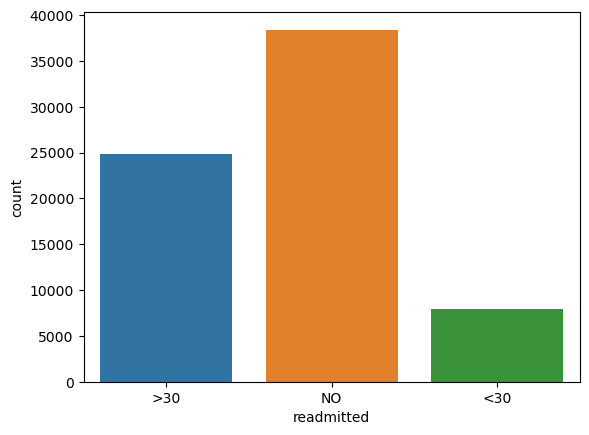

In [12]:
_ = sns.countplot(x=train_df['readmitted'])

Now let's concrete on independant columns one by one

---

##### `race`

`77%` of patients are `Caucasian`.

In [13]:
round(train_df['race'].value_counts(normalize=True)*100, 2)

Caucasian          77.01
AfricanAmerican    18.87
Hispanic            2.00
Other               1.48
Asian               0.63
Name: race, dtype: float64

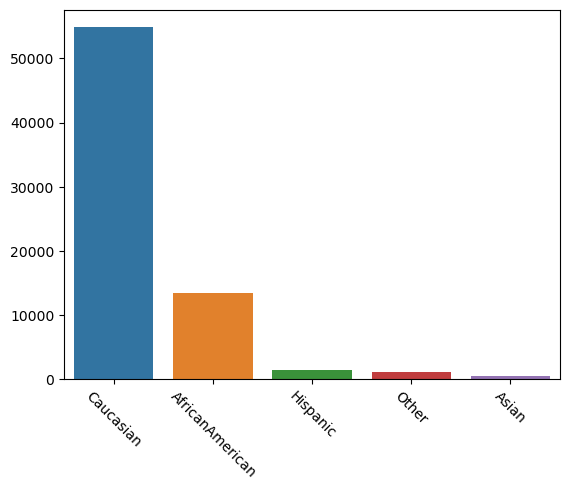

In [14]:
sns.barplot(x=train_df['race'].value_counts().index, y=train_df['race'].value_counts().values)
_ = plt.xticks(rotation=-45)

Merge `Asian` and `Hispanic` to `others`

In [15]:
train_df['race'] = train_df['race'].replace({'Asian': 'Other', 'Hispanic': 'Other'}).values
test_df['race'] = test_df['race'].replace({'Asian': 'Other', 'Hispanic': 'Other'}).values

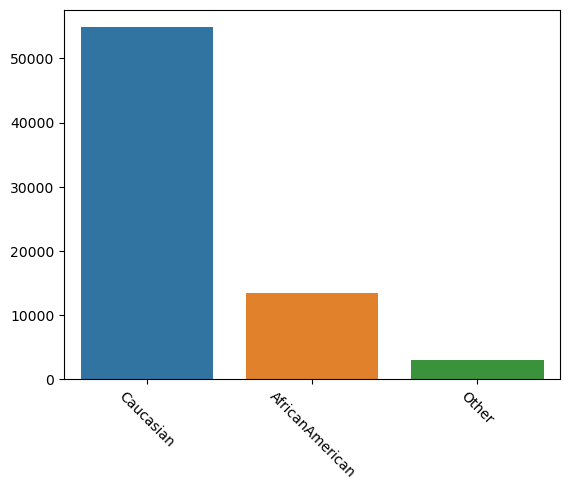

In [16]:
sns.barplot(x=train_df['race'].value_counts().index, y=train_df['race'].value_counts().values)
_ = plt.xticks(rotation=-45)

##### `gender`

Almost equal distribution for `gender`

In [17]:
round(train_df['gender'].value_counts(normalize=True)*100, 2)

Female    53.76
Male      46.24
Name: gender, dtype: float64

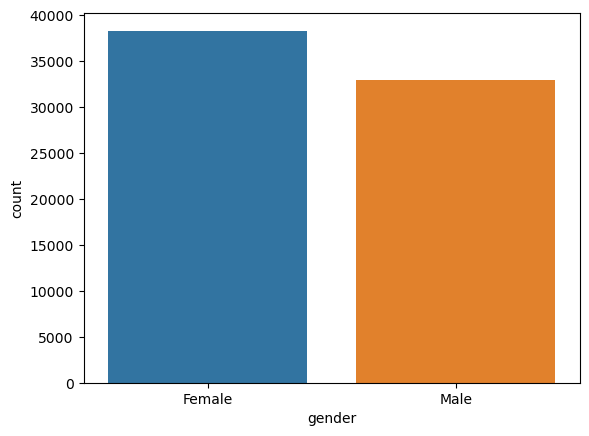

In [18]:
_ = sns.countplot(x=train_df['gender'])

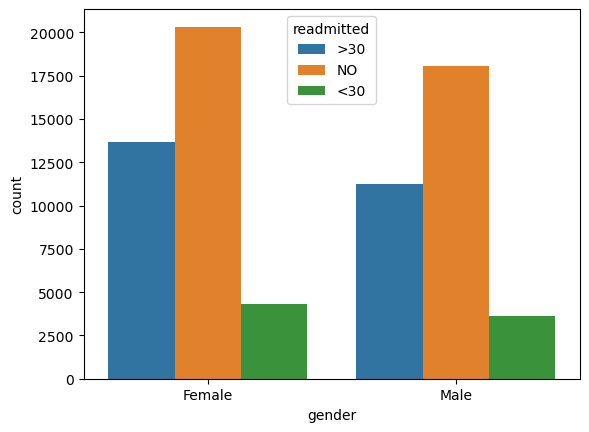

In [19]:
_ = sns.countplot(x=train_df['gender'], hue=train_df['readmitted'])

##### `age`

Most of patients are in range `[50, 80]` years old

In [20]:
round(train_df['age'].value_counts(normalize=True)*100, 2)

[70-80)     25.66
[60-70)     21.99
[50-60)     17.02
[80-90)     16.91
[40-50)      9.49
[30-40)      3.73
[90-100)     2.72
[20-30)      1.64
[10-20)      0.67
[0-10)       0.16
Name: age, dtype: float64

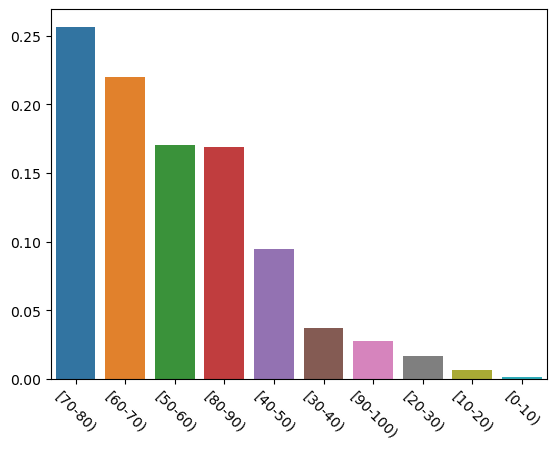

In [21]:
sns.barplot(x=train_df['age'].value_counts().index, y=train_df['age'].value_counts(normalize=True).values)
_ = plt.xticks(rotation=-45)

Subistute every category in `age` by its middle value 

In [22]:
train_df['age'] = train_df['age'].map({ '[70-80)': 75,
                            '[60-70)': 65,
                            '[80-90)': 85,
                            '[50-60)': 55,
                            '[40-50)':45,
                            '[30-40)': 35,
                            '[90-100)':95,
                            '[20-30)':25,
                            '[10-20)':15,
                            '[0-10)': 5})

test_df['age'] = test_df['age'].map({ '[70-80)': 75,
                            '[60-70)': 65,
                            '[80-90)': 85,
                            '[50-60)': 55,
                            '[40-50)':45,
                            '[30-40)': 35,
                            '[90-100)':95,
                            '[20-30)':25,
                            '[10-20)':15,
                            '[0-10)': 5})


train_df['age'].value_counts()

75    18277
65    15662
55    12125
85    12048
45     6763
35     2659
95     1941
25     1165
15      479
5       117
Name: age, dtype: int64

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  """Entry point for launching an IPython kernel.


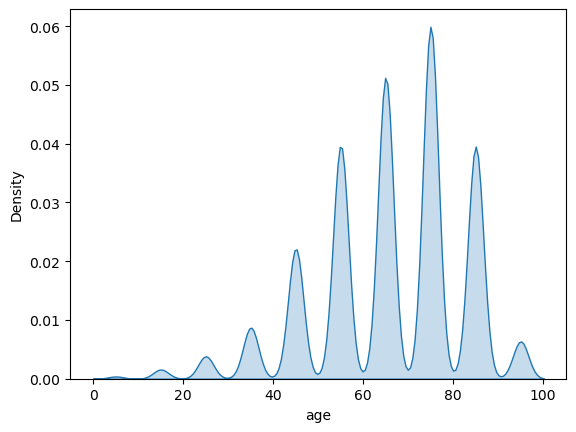

In [23]:
_ = sns.kdeplot(x=train_df['age'], shade=True)

##### `admission_type_id`

Here're the corresponding value for each id in `admission_type_id`

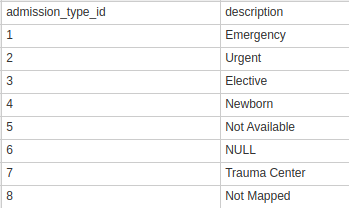

So let's map IDs to their values to help us in more analysis

In [24]:
mapping = {1: 'Emergency', 2: 'Urgent', 3: 'Elective', 4: 'Newborn', 5: 'Not Availabel', 6: 'NULL', 7: 'Trauma Center', 8: 'Not Mapped'}

admission_type = train_df['admission_type_id'].map(mapping)

In [25]:
admission_type.value_counts()

Emergency        37822
Elective         13163
Urgent           12907
NULL              3690
Not Availabel     3411
Not Mapped         224
Trauma Center       14
Newborn              5
Name: admission_type_id, dtype: int64

In [26]:
train_df[train_df['admission_type_id'] == 4][['admission_type_id', 'readmitted']]

,admission_type_id,readmitted
23053,4,NO
30588,4,NO
44068,4,NO
52806,4,NO
57503,4,>30


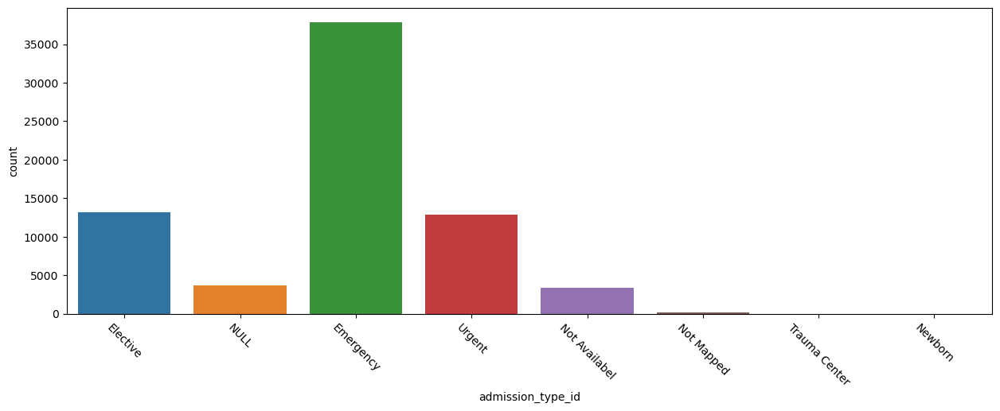

In [27]:
fig,ax=plt.subplots(figsize=(15,5))

sns.countplot(x=admission_type, ax=ax)
_ = plt.xticks(rotation=-45)

We can see that:
- `Emergency` and `Urgent` and `Trauma Center` are the same as Emergency, so they'll be same category (`Emergency`).

- `Not available` and `Null` and `Not Mapped` also considered as the same category (`unknown`).

- Now, we think if we can consider `Elective` and `Newborn` as one category or separated categories, finally we dicided to merge them as `Newborn` have few entries.
<!-- separate them into two categories specially later we will have some categories referts to new born or babies. -->

So let's merge them.

In [28]:
mapping = {1: 'Emergency', 2: 'Emergency', 3: 'Elective', 4: 'Unknown', 5: 'Unknown', 6: 'Unknown', 7: 'Emergency', 8: 'Unknown'}

train_df['admission_type'] = train_df['admission_type_id'].map(mapping)
test_df['admission_type'] = test_df['admission_type_id'].map(mapping)

train_df = train_df.drop(columns='admission_type_id')
test_df = test_df.drop(columns='admission_type_id')

Now we have 3 categories insetead of 8

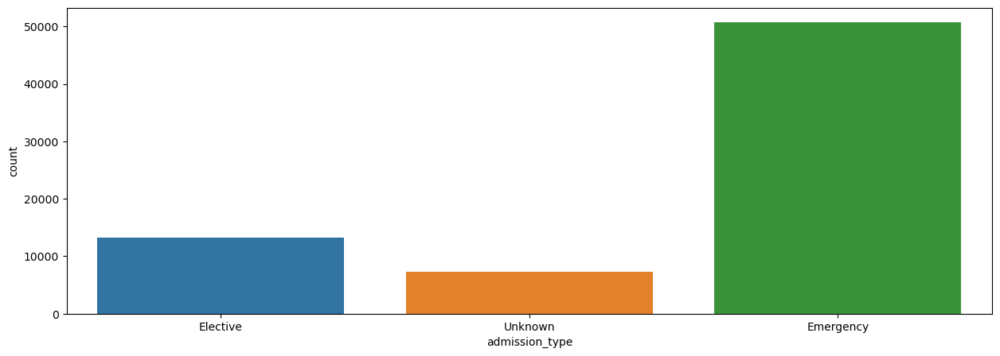

In [29]:
fig,ax=plt.subplots(figsize=(15,5))

_ = sns.countplot(x=train_df['admission_type'], ax=ax)

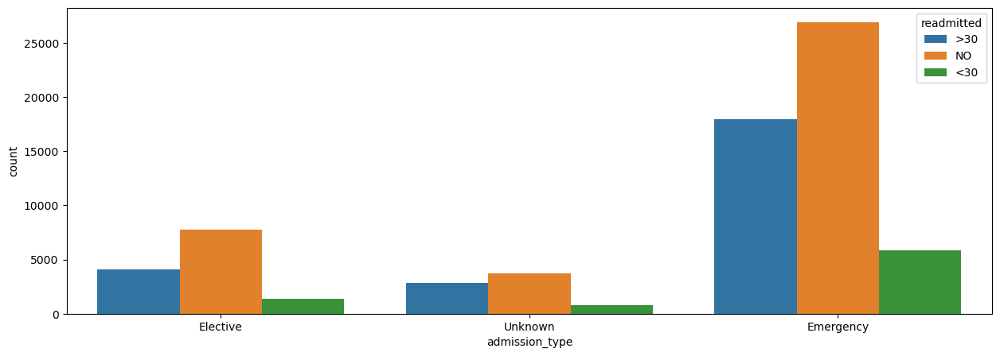

In [30]:
fig,ax=plt.subplots(figsize=(15,5))

_ = sns.countplot(x=train_df['admission_type'],hue=train_df['readmitted'],ax=ax) 

##### `discharge_disposition_id`

Here're the corresponding value for each id in `discharge_disposition_id`

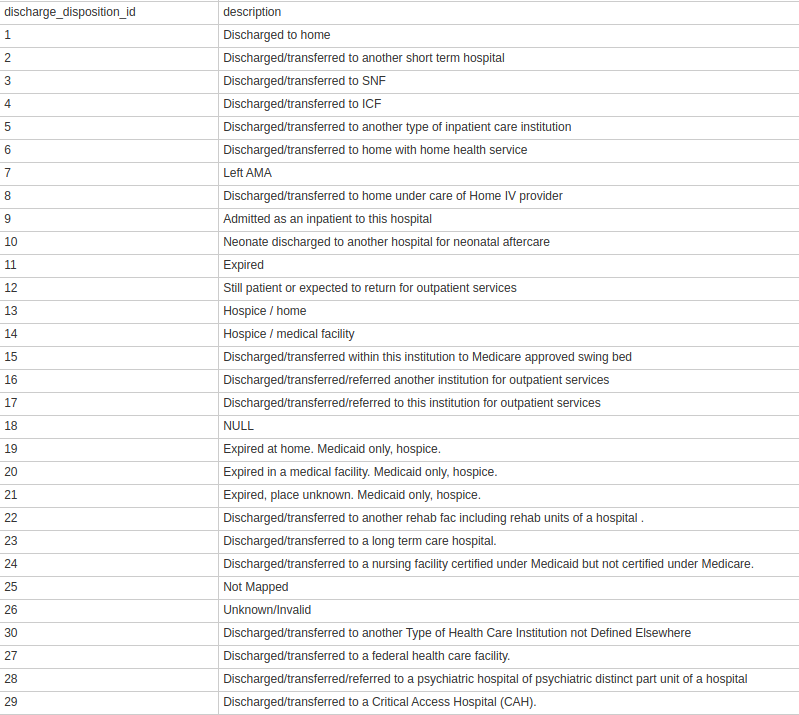

Terminologies: 
- `Against medical advice (AMA)`, sometimes known as discharge against medical advice (DAMA), is a term used in health care institutions when a patient leaves a hospital against the advice of their doctor.
<!--  -->
[Reference](https://en.wikipedia.org/wiki/Against_medical_advice)

- `SKILLED NURSING FACILITY (SNF)` A nursing facility with the staff and equipment to give skilled nursing care and/or skilled rehabilitation services and other related health services. SKILLED NURSING FACILITY CARE. This is a level of care that requires the daily involvement of skilled nursing or rehabilitation staff.
<!--  -->
[Reference](https://www.cms.gov/glossary?term=skilled+nursing+facility&items_per_page=10&viewmode=grid#:~:text=SKILLED%20NURSING%20FACILITY%20(SNF),skilled%20nursing%20or%20rehabilitation%20staff)

- `Intermediate care facility (ICF)`, a health related facility designed to provide custodial care for individuals unable to care for themselves because of mental or physical infirmity.
<!--  -->
[Reference](https://medical-dictionary.thefreedictionary.com/ICF)



---


As we did before with `admission_type_id`, let's categorize values of `discharge_disposition_id` also as follows:
- IDs: [`7, 12`] → `Patient with no care`.

 - Note: we were confused about merging ***patient leaves a hospital against the advice of their doctor (AMA)*** with ***Still patient or expected to return for outpatient services*** as one category or not, but finally we decided to merge as they have the same effect on the patient

- IDs: [`1`] → `Home`.

- IDs: [`6, 8`] → `Care at Home`.

- IDs: [`10`] → `Neonate`.

- IDs: [`2, 3, 4, 5, 16, 22, 23, 24, 27, 28, 29, 30`] → `Other`.

- IDs: [`13, 14`] → `Hospice`.

- IDs: [`11, 19, 20, 21`] → `Expired`.

- IDs: [`18, 25, 26`] → `Unknown`.

- IDs: [`9, 15, 17`] → `Inpatient`.

- IDs: [`17`] → `Outpatient`.


So let's merge them.


In [31]:
mapping = {'Home': [1],
           'Care at Home': [6, 8],
           'Neonate': [10],
           'Hospice': [13, 14],
           'Expired': [11, 19, 20, 21],
           'Unknown': [18, 25, 26],
           'Inpatient': [9, 15, 17],
           'Outpatient': [17],
           'Patient with no care': [7, 12],
           'Other': [2, 3, 4, 5, 10, 16, 22, 23, 24, 27, 28, 29, 30]}

# get copy from discharge_disposition_id columns to apply mapping on it
train_discharge_disposition = train_df['discharge_disposition_id'].copy()
test_discharge_disposition = test_df['discharge_disposition_id'].copy()

# mapping
for category, ids in mapping.items():
  train_discharge_disposition = train_discharge_disposition.replace(ids, category)
  test_discharge_disposition = test_discharge_disposition.replace(ids, category)

# add mapped column to dataframe and drop unmapped columns
train_df['discharge_disposition'] = train_discharge_disposition
train_df = train_df.drop(columns='discharge_disposition_id')

test_df['discharge_disposition'] = test_discharge_disposition
test_df = test_df.drop(columns='discharge_disposition_id')


train_df['discharge_disposition'].value_counts()

Home                    42164
Other                   14503
Care at Home             9105
Unknown                  3267
Expired                  1152
Hospice                   537
Patient with no care      429
Inpatient                  73
Neonate                     6
Name: discharge_disposition, dtype: int64

Now we have 8 categories insetead of 30

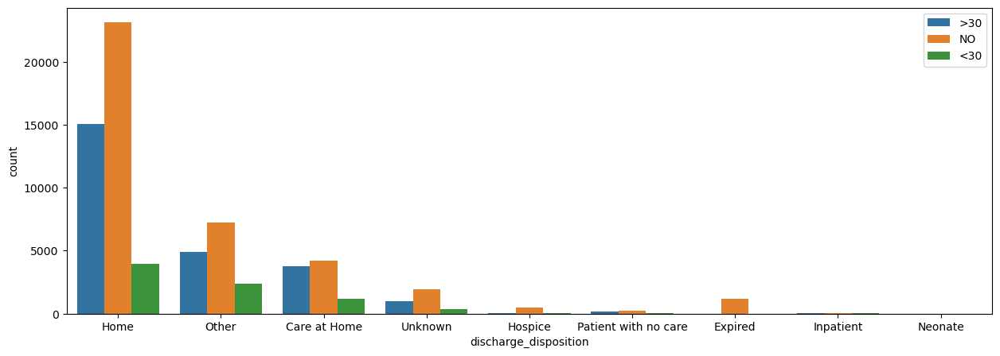

In [32]:
fig,ax=plt.subplots(figsize=(15,5))

_ = sns.countplot(x=train_df['discharge_disposition'],hue=train_df['readmitted'],ax=ax) 

_ = plt.legend(loc='upper right')

If we considered that Expired and hospice mean dead then it's reasonable that all expired patients didn't readmit again as shown below.

In [33]:
train_df[train_df['discharge_disposition'] == 'Expired'][['discharge_disposition', 'readmitted']].value_counts()

discharge_disposition  readmitted
Expired                NO            1152
dtype: int64

##### `addmission_source_id`

Here're the corresponding value for each id in `admission_source_id`

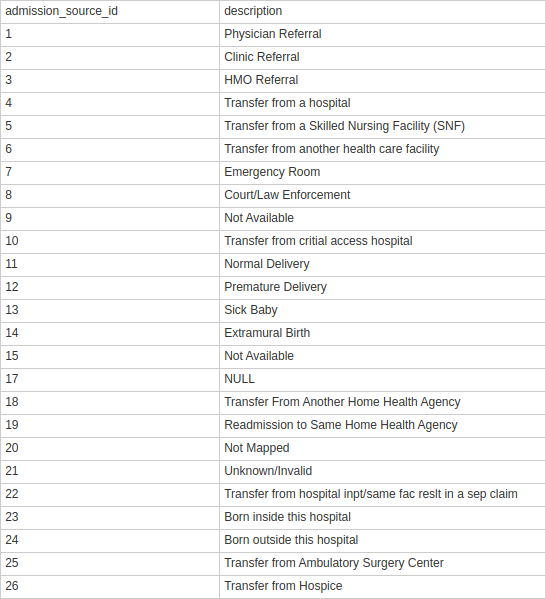

Terminologies: 
- `Health Maintenance Organization(HMO)`, A type of health insurance plan that usually limits coverage to care from doctors who work for or contract with the HMO
<!--  -->
[Reference](https://www.healthcare.gov/glossary/health-maintenance-organization-hmo/#:~:text=A%20type%20of%20health%20insurance,to%20be%20eligible%20for%20coverage).

- `SKILLED NURSING FACILITY (SNF)` A nursing facility with the staff and equipment to give skilled nursing care and/or skilled rehabilitation services and other related health services. SKILLED NURSING FACILITY CARE. This is a level of care that requires the daily involvement of skilled nursing or rehabilitation staff.
<!--  -->
[Reference](https://www.cms.gov/glossary?term=skilled+nursing+facility&items_per_page=10&viewmode=grid#:~:text=SKILLED%20NURSING%20FACILITY%20(SNF),skilled%20nursing%20or%20rehabilitation%20staff)



---


As we did before with `admission_type_id` and `discharge_disposition_id`, let's categorize values of `admission_source_id` also as follows:

Note: After trying multiple try for clustering different IDs together, we found this the most resonable distribution.

- IDs: [`1, 2, 3`] → `Referral`.

- IDs: [`4, 5, 6, 10, 18, 19, 22, 25, 26`] → `Transfer`.

- IDs: [`7`] → `Emergency`.

- IDs: [8, `11, 12, 13, 14, 24, 25`] → `Delivery`.

- IDs: [`9, 15, 17, 20, 21`] → `Unknown`.

So let's merge them.


In [34]:
mapping = {'Referral': [1, 2, 3],
           'Transfer': [4, 5, 6, 10, 18, 19, 22, 25, 26],
           'Emergency': [7],
           'Delivery': [8, 11, 12, 13, 14, 24, 25],
           'Unknown': [9, 15, 17, 20, 21],
           }

# get copy from admission_source_id columns to apply mapping on it
train_admission_source = train_df['admission_source_id'].copy()
test_admission_source = test_df['admission_source_id'].copy()

# mapping
for category, ids in mapping.items():
  train_admission_source = train_admission_source.replace(ids, category)
  test_admission_source = test_admission_source.replace(ids, category)

# add mapped column to dataframe and drop unmapped columns
train_df['admission_source'] = train_admission_source
train_df = train_df.drop(columns='admission_source_id')

test_df['admission_source'] = test_admission_source
test_df = test_df.drop(columns='admission_source_id')

train_df['admission_source'].value_counts()

Emergency    40195
Referral     21608
Unknown       5010
Transfer      4407
Delivery        16
Name: admission_source, dtype: int64

Now we have 5 categories insetead of 26.

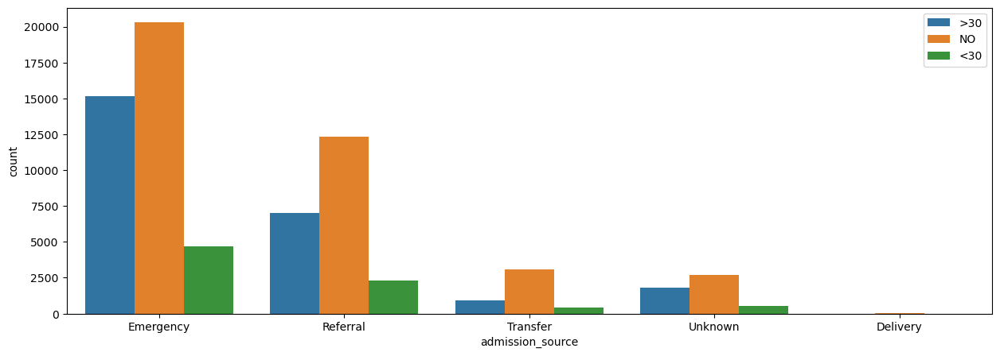

In [35]:
fig,ax=plt.subplots(figsize=(15,5))

sns.countplot(x=train_df['admission_source'],hue=train_df['readmitted'],ax=ax) 
_ = plt.legend(loc='upper right')

##### `time_in_hospital`

`time_in_hospital` shows right skewness

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  This is separate from the ipykernel package so we can avoid doing imports until


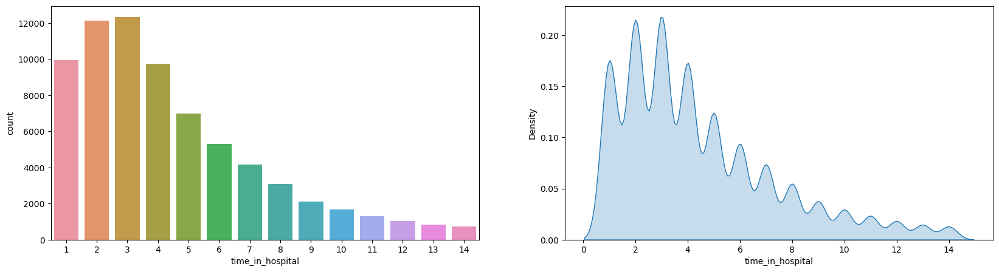

In [36]:
figure, subplots = plt.subplots(1, 2, figsize=(20, 5))
_ = sns.countplot(x=train_df['time_in_hospital'], ax=subplots[0])
_ = sns.kdeplot(train_df['time_in_hospital'], shade=True, ax=subplots[1])

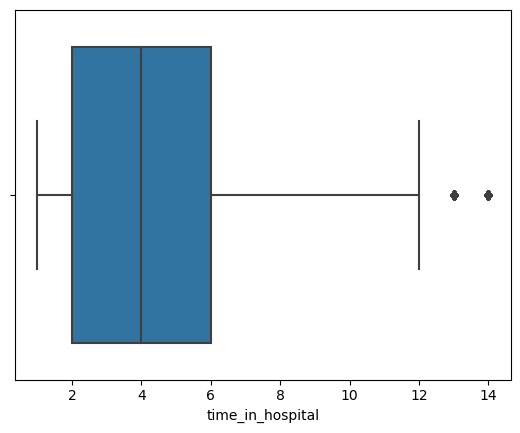

In [37]:
_ = sns.boxplot(x=train_df['time_in_hospital'])

##### `num_lab_procedures`

`num_lab_procedures` shows a little bit right skewness

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  This is separate from the ipykernel package so we can avoid doing imports until


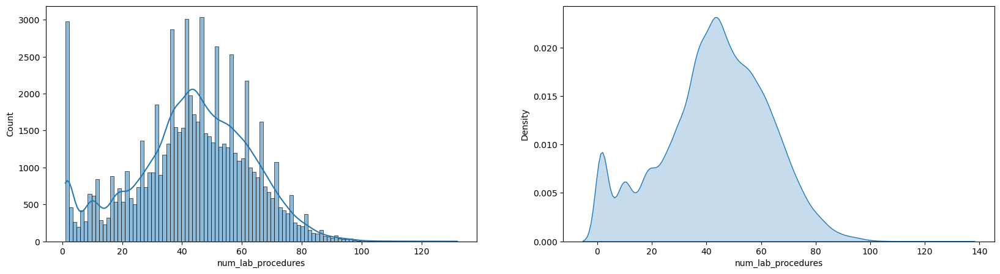

In [38]:
figure, subplots = plt.subplots(1, 2, figsize=(20, 5))
_ = sns.histplot(train_df['num_lab_procedures'], kde=True, ax=subplots[0])
_ = sns.kdeplot(train_df['num_lab_procedures'], shade=True, ax=subplots[1])

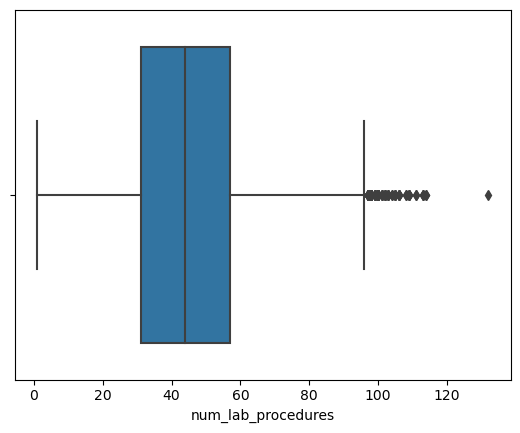

In [39]:
_ = sns.boxplot(x=train_df['num_lab_procedures'])

##### `num_procedures`

`num_procedures` shows a right skewness

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  This is separate from the ipykernel package so we can avoid doing imports until


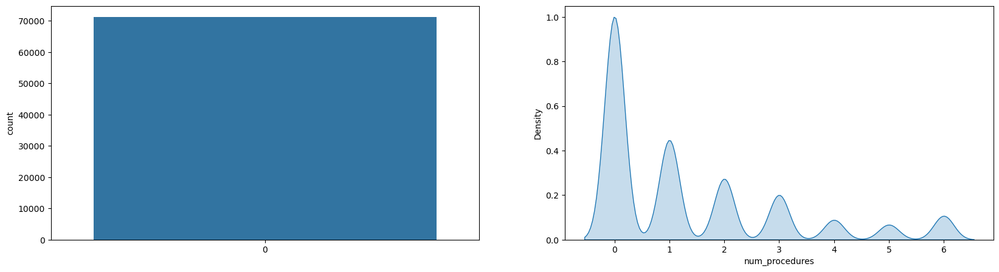

In [40]:
figure, subplots = plt.subplots(1, 2, figsize=(20, 5))
_ = sns.countplot(train_df['num_procedures'], ax=subplots[0])
_ = sns.kdeplot(train_df['num_procedures'], shade=True, ax=subplots[1])

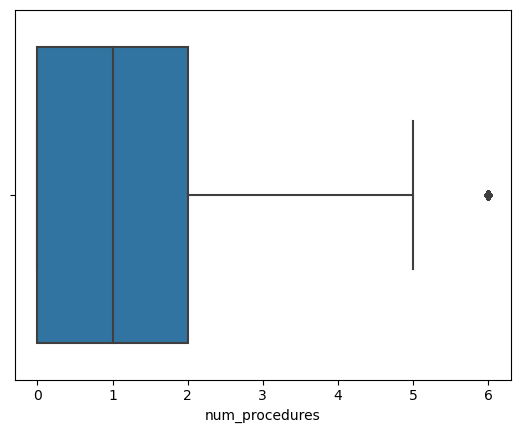

In [41]:
_ = sns.boxplot(x=train_df['num_procedures'])

##### `num_medications`

`num_medications` shows a little bit right skewness

In [42]:
train_df['num_medications'].describe()

count    71236.000000
mean        16.017014
std          8.102990
min          1.000000
25%         10.000000
50%         15.000000
75%         20.000000
max         81.000000
Name: num_medications, dtype: float64

On average, a patient is prescribed 15 different types of medication during an encounter.

In [43]:
print('Mean:', train_df['num_medications'].mean())
print('Median:', train_df['num_medications'].median())
print('Mode:', train_df['num_medications'].mode()[0])

Mean: 16.01701386939188
Median: 15.0
Mode: 12


/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  """Entry point for launching an IPython kernel.


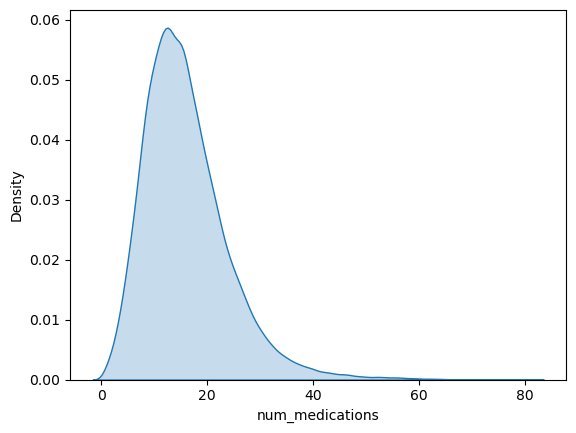

In [44]:
_ = sns.kdeplot(train_df['num_medications'], shade=True)

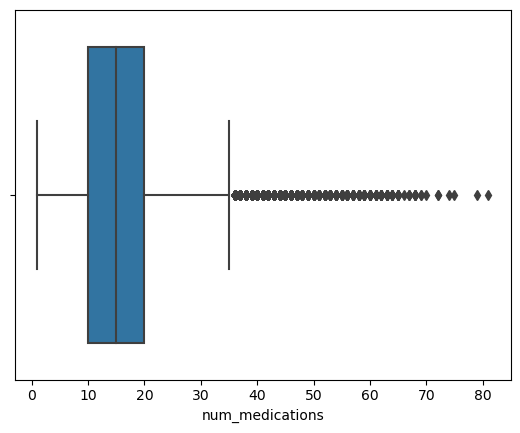

In [45]:
_ = sns.boxplot(x=train_df['num_medications'])

##### `number_outpatient`

`number_outpatient` shows that most of patients don't have outpatient visits in the year preceding the encounter

In [46]:
round(train_df['number_outpatient'].value_counts(normalize=True)*100, 2)

0     83.57
1      8.34
2      3.55
3      2.01
4      1.11
5      0.51
6      0.31
7      0.14
8      0.09
9      0.08
10     0.05
11     0.04
13     0.03
14     0.03
12     0.03
15     0.02
16     0.02
20     0.01
18     0.01
17     0.01
21     0.00
22     0.00
24     0.00
19     0.00
35     0.00
25     0.00
26     0.00
29     0.00
40     0.00
33     0.00
27     0.00
39     0.00
28     0.00
34     0.00
38     0.00
Name: number_outpatient, dtype: float64

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  This is separate from the ipykernel package so we can avoid doing imports until


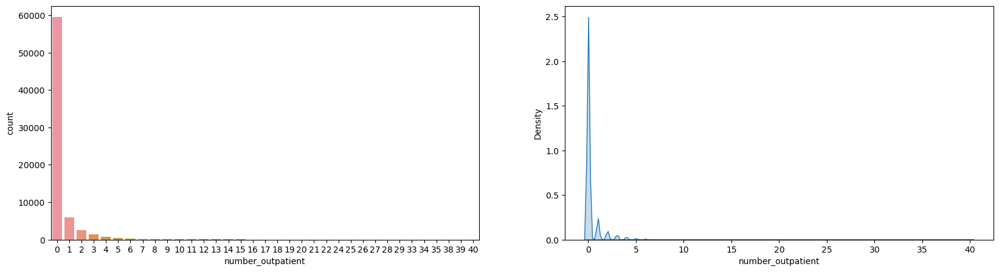

In [47]:
figure, subplots = plt.subplots(1, 2, figsize=(20, 5))
_ = sns.countplot(x=train_df['number_outpatient'], ax=subplots[0])
_ = sns.kdeplot(train_df['number_outpatient'], shade=True, ax=subplots[1])

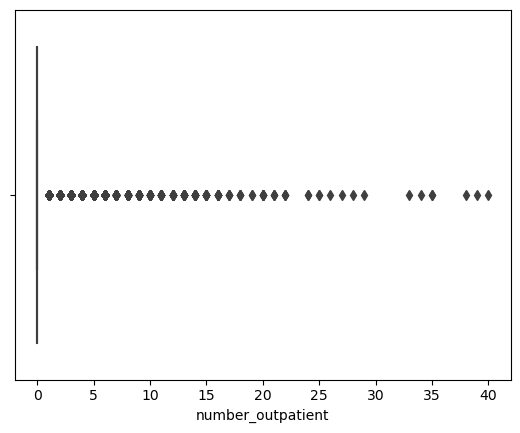

In [48]:
_ = sns.boxplot(x=train_df['number_outpatient'])

##### `number_emergency`

`number_emergency` shows that most of patients don't have emergency visits in the year preceding the encounter

In [49]:
round(train_df['number_emergency'].value_counts(normalize=True)*100, 2)

0     88.82
1      7.58
2      2.01
3      0.71
4      0.35
5      0.18
6      0.09
7      0.07
8      0.04
10     0.03
9      0.03
11     0.02
13     0.01
12     0.01
18     0.01
20     0.01
16     0.01
14     0.00
19     0.00
22     0.00
25     0.00
21     0.00
15     0.00
54     0.00
76     0.00
29     0.00
37     0.00
42     0.00
Name: number_emergency, dtype: float64

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  This is separate from the ipykernel package so we can avoid doing imports until


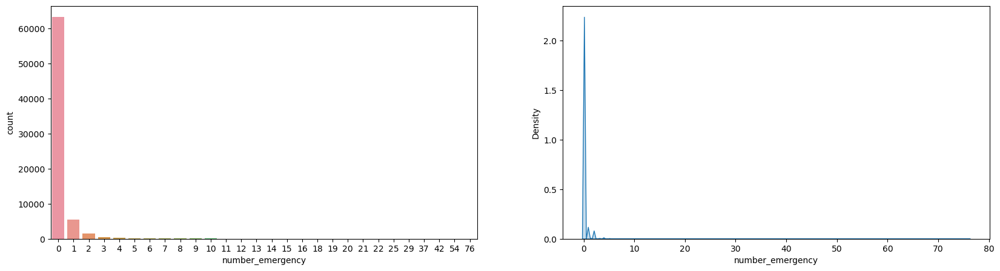

In [50]:
figure, subplots = plt.subplots(1, 2, figsize=(20, 5))
_ = sns.countplot(x=train_df['number_emergency'], ax=subplots[0])
_ = sns.kdeplot(train_df['number_emergency'], shade=True, ax=subplots[1])

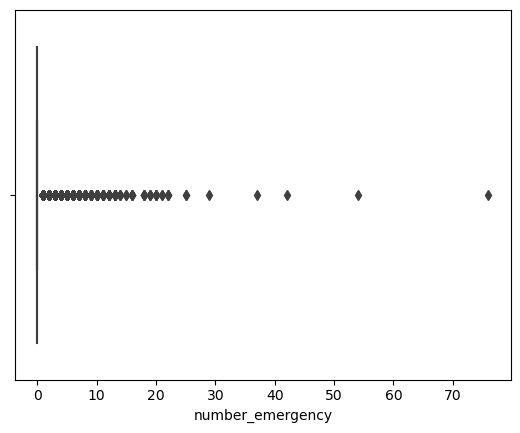

In [51]:
_ = sns.boxplot(x=train_df['number_emergency'])

##### `number_inpatient`

`number_inpatient` shows that most of patients don't have or have one emergency visits in the year preceding the encounter.

In [52]:
round(train_df['number_inpatient'].value_counts(normalize=True)*100, 2)

0     66.45
1     19.19
2      7.53
3      3.33
4      1.59
5      0.80
6      0.43
7      0.27
8      0.14
9      0.10
10     0.06
11     0.04
12     0.03
13     0.02
15     0.01
14     0.01
16     0.01
17     0.00
19     0.00
21     0.00
18     0.00
Name: number_inpatient, dtype: float64

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  This is separate from the ipykernel package so we can avoid doing imports until


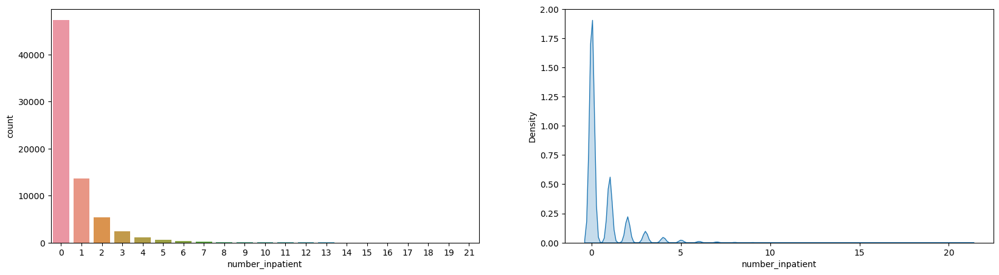

In [53]:
figure, subplots = plt.subplots(1, 2, figsize=(20, 5))
_ = sns.countplot(x=train_df['number_inpatient'], ax=subplots[0])
_ = sns.kdeplot(train_df['number_inpatient'], shade=True, ax=subplots[1])

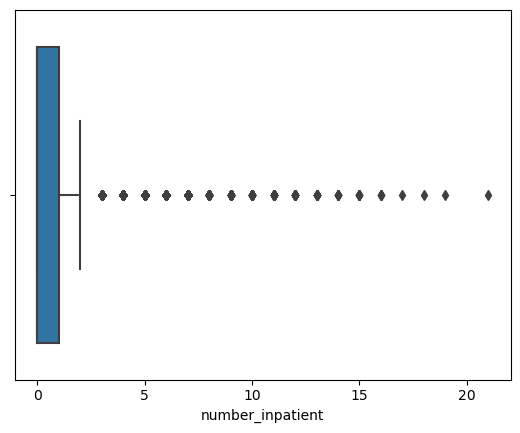

In [54]:
_ = sns.boxplot(x=train_df['number_inpatient'])

##### `diag_1`, `diag_2`, `diag_3`

You can check ICD-9 Codes Lookup from [here](https://www.aapc.com/codes/icd9-codes-range/)

Here we map IDs to its category in `diag_1`, `diag_2`, `diag_3`.

In [55]:
ICD_map = {
           'INFECTIOUS AND PARASITIC': [1, 139],
           'NEOPLASMS': [140, 239],
           'ENDOCRINE, NUTRITIONAL, METABOLIC, IMMUNITY': [240, 279],
           'BLOOD': [280, 289],
           'MENTAL, NEURODEVELOPMENTAL': [290, 319],
           'NERVOUS, SENSE ORGANS': [320, 389],
           'CIRCULATORY': [390, 459],
           'RESPIRATORY': [460, 519],
           'DIGESTIVE': [520, 579],
           'GENITOURINARY': [580, 629],
           'PREGNANCY, CHILDBIRTH, PUERPERIUM': [630, 679],
           'SKIN AND SUBCUTANEOUS': [680, 709],
           'MUSCULOSKELETAL, CONNECTIVE': [710, 739],
           'CONGENITAL ANOMALIES': [740, 759],
           'CERTAIN CONDITIONS ORIGINATING': [760, 779],
           'SYMPTOMS, SIGNS, AND ILL-DEFINED CONDITIONS': [780, 799],
           'INJURY AND POISONING': [800, 999],
           }

for i in range(3):
  
  column = f'diag_{i+1}'

  # replace codes starts with E to 'EXTERNAL INJURY AND POISONING'
  train_df[column] = train_df[column].mask(train_df[column].str.startswith('E'), 'EXTERNAL INJURY AND POISONING')
  test_df[column] = test_df[column].mask(test_df[column].str.startswith('E'), 'EXTERNAL INJURY AND POISONING')

  # replace codes starts with V to 'INFLUENCING HEALTH STATUS AND CONTACT WITH HEALTH SERVICES'
  train_df[column] = train_df[column].mask(train_df[column].str.startswith('V'), 'INFLUENCING HEALTH STATUS AND CONTACT WITH HEALTH SERVICES')
  test_df[column] = test_df[column].mask(test_df[column].str.startswith('V'), 'INFLUENCING HEALTH STATUS AND CONTACT WITH HEALTH SERVICES')

"""
# replace codes starts with E to -1
train_df['diag_1'] = train_df['diag_1'].mask(train_df['diag_1'].str.startswith('E'), 'EXTERNAL INJURY AND POISONING')
train_df['diag_2'] = train_df['diag_2'].mask(train_df['diag_2'].str.startswith('E'), 'EXTERNAL INJURY AND POISONING')
train_df['diag_3'] = train_df['diag_3'].mask(train_df['diag_3'].str.startswith('E'), 'EXTERNAL INJURY AND POISONING')

test_df['diag_1'] = test_df['diag_1'].mask(test_df['diag_1'].str.startswith('E'), 'EXTERNAL INJURY AND POISONING')
test_df['diag_2'] = test_df['diag_2'].mask(test_df['diag_2'].str.startswith('E'), 'EXTERNAL INJURY AND POISONING')
test_df['diag_3'] = test_df['diag_3'].mask(test_df['diag_3'].str.startswith('E'), 'EXTERNAL INJURY AND POISONING')

# replace codes starts with V to -2
train_df['diag_1'] = train_df['diag_1'].mask(train_df['diag_1'].str.startswith('V'), 'INFLUENCING HEALTH STATUS AND CONTACT WITH HEALTH SERVICES')
train_df['diag_2'] = train_df['diag_2'].mask(train_df['diag_2'].str.startswith('V'), 'INFLUENCING HEALTH STATUS AND CONTACT WITH HEALTH SERVICES')
train_df['diag_3'] = train_df['diag_3'].mask(train_df['diag_3'].str.startswith('V'), 'INFLUENCING HEALTH STATUS AND CONTACT WITH HEALTH SERVICES')

test_df['diag_1'] = test_df['diag_1'].mask(test_df['diag_1'].str.startswith('V'), 'INFLUENCING HEALTH STATUS AND CONTACT WITH HEALTH SERVICES')
test_df['diag_2'] = test_df['diag_2'].mask(test_df['diag_2'].str.startswith('V'), 'INFLUENCING HEALTH STATUS AND CONTACT WITH HEALTH SERVICES')
test_df['diag_3'] = test_df['diag_3'].mask(test_df['diag_3'].str.startswith('V'), 'INFLUENCING HEALTH STATUS AND CONTACT WITH HEALTH SERVICES')

"""
# mapping IDs
for i, (desc, ids) in enumerate(ICD_map.items()):

  # this line of code works well with first iteration only 
  # because columns type will be object after it which between can not applied on
  # train_df['diag_1'] = train_df['diag_1'].mask(train_df['diag_1'].between(ids[0], ids[-1]), desc)

  # if value could be converted to float then replace it with its description else then it's alread a description
  train_df['diag_1'] = train_df['diag_1'].apply(lambda x: desc if x.replace('.', '').isdigit() and ids[0] <= float(x) <= ids[-1] else x)
  train_df['diag_2'] = train_df['diag_2'].apply(lambda x: desc if x.replace('.', '').isdigit() and ids[0] <= float(x) <= ids[-1] else x)
  train_df['diag_3'] = train_df['diag_3'].apply(lambda x: desc if x.replace('.', '').isdigit() and ids[0] <= float(x) <= ids[-1] else x)

  test_df['diag_1'] = test_df['diag_1'].apply(lambda x: desc if x.replace('.', '').isdigit() and ids[0] <= float(x) <= ids[-1] else x)
  test_df['diag_2'] = test_df['diag_2'].apply(lambda x: desc if x.replace('.', '').isdigit() and ids[0] <= float(x) <= ids[-1] else x)
  test_df['diag_3'] = test_df['diag_3'].apply(lambda x: desc if x.replace('.', '').isdigit() and ids[0] <= float(x) <= ids[-1] else x)

As demonstrated below, `CIRCULATORY` and `ENDOCRINE, NUTRITIONAL METABOLIC, IMMUNITY` are the most common diseases among patients

In [56]:
round(train_df['diag_1'].value_counts(normalize=True)*100, 2)

CIRCULATORY                                                   29.85
ENDOCRINE, NUTRITIONAL, METABOLIC, IMMUNITY                   11.10
RESPIRATORY                                                   10.21
DIGESTIVE                                                      9.13
SYMPTOMS, SIGNS, AND ILL-DEFINED CONDITIONS                    7.57
INJURY AND POISONING                                           6.93
GENITOURINARY                                                  4.99
MUSCULOSKELETAL, CONNECTIVE                                    4.81
NEOPLASMS                                                      3.34
INFECTIOUS AND PARASITIC                                       2.74
SKIN AND SUBCUTANEOUS                                          2.49
MENTAL, NEURODEVELOPMENTAL                                     2.21
INFLUENCING HEALTH STATUS AND CONTACT WITH HEALTH SERVICES     1.61
NERVOUS, SENSE ORGANS                                          1.18
BLOOD                                           

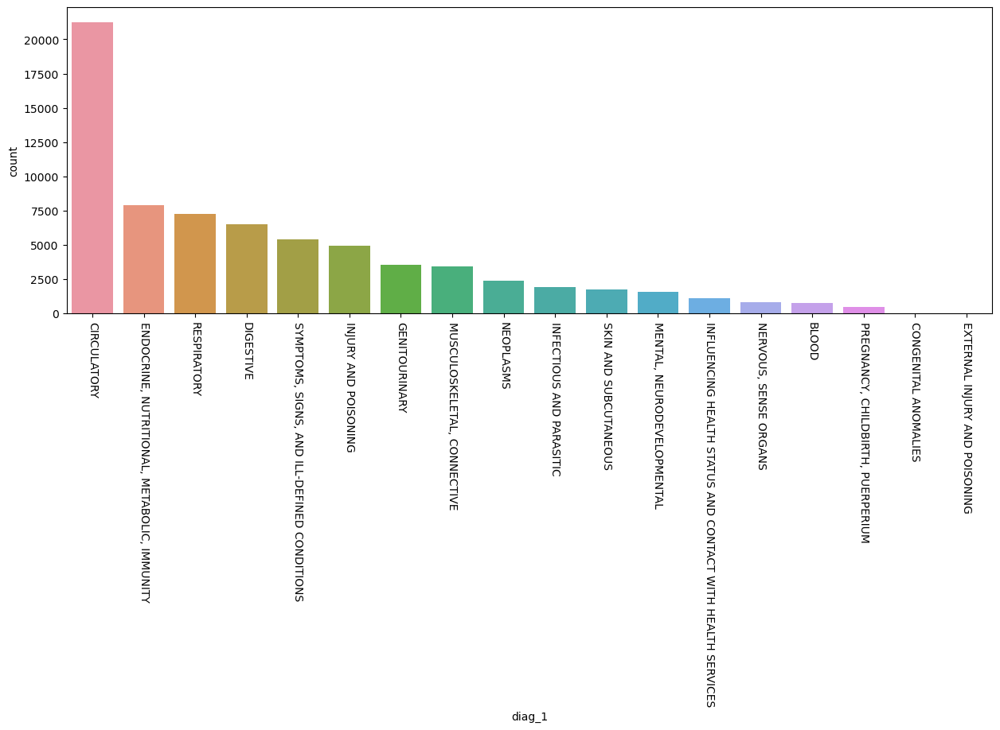

In [57]:
fig,ax=plt.subplots(figsize=(15,5))

sns.countplot(x=train_df['diag_1'], order=train_df['diag_1'].value_counts().index, ax=ax)
_ = plt.xticks(rotation=-90)

In [58]:
round(train_df['diag_2'].value_counts(normalize=True) * 100, 2)

CIRCULATORY                                                   31.33
ENDOCRINE, NUTRITIONAL, METABOLIC, IMMUNITY                   20.48
RESPIRATORY                                                   10.05
GENITOURINARY                                                  7.78
SYMPTOMS, SIGNS, AND ILL-DEFINED CONDITIONS                    4.61
DIGESTIVE                                                      3.97
SKIN AND SUBCUTANEOUS                                          3.50
BLOOD                                                          2.83
MENTAL, NEURODEVELOPMENTAL                                     2.63
NEOPLASMS                                                      2.52
INJURY AND POISONING                                           2.39
INFECTIOUS AND PARASITIC                                       1.89
INFLUENCING HEALTH STATUS AND CONTACT WITH HEALTH SERVICES     1.76
MUSCULOSKELETAL, CONNECTIVE                                    1.71
NERVOUS, SENSE ORGANS                           

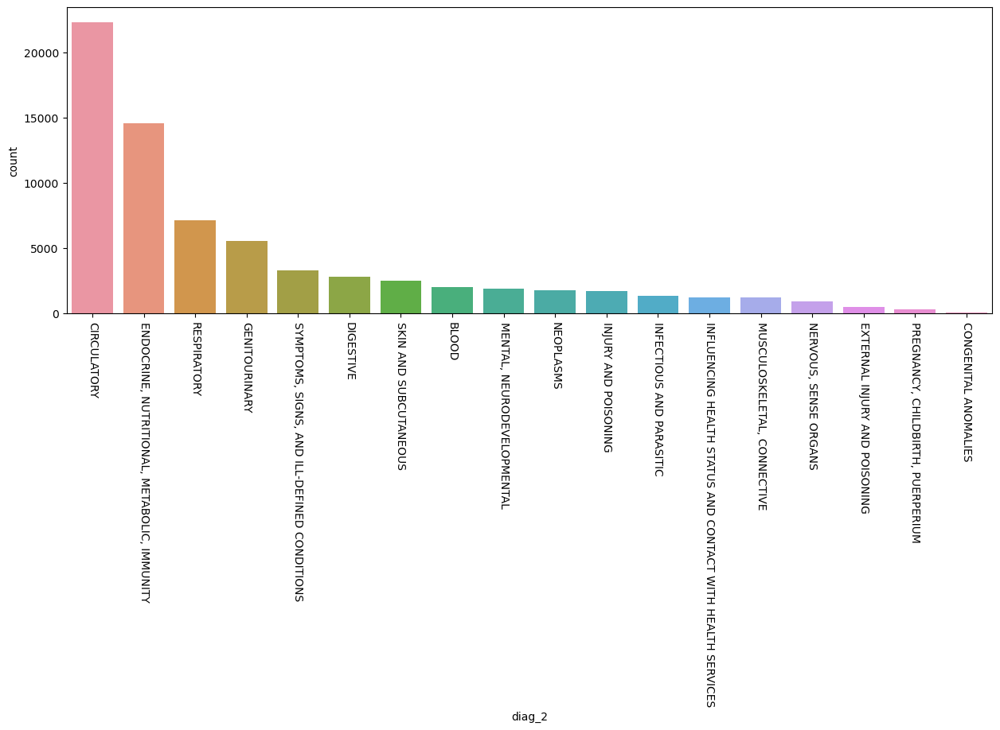

In [59]:
fig,ax=plt.subplots(figsize=(15,5))

sns.countplot(x=train_df['diag_2'], order=train_df['diag_2'].value_counts().index, ax=ax)
_ = plt.xticks(rotation=-90)

In [60]:
round((train_df['diag_3'].value_counts(normalize=True)*100), 2)

CIRCULATORY                                                   29.43
ENDOCRINE, NUTRITIONAL, METABOLIC, IMMUNITY                   27.40
RESPIRATORY                                                    6.55
GENITOURINARY                                                  6.23
SYMPTOMS, SIGNS, AND ILL-DEFINED CONDITIONS                    4.41
INFLUENCING HEALTH STATUS AND CONTACT WITH HEALTH SERVICES     3.75
DIGESTIVE                                                      3.52
MENTAL, NEURODEVELOPMENTAL                                     3.11
SKIN AND SUBCUTANEOUS                                          2.42
BLOOD                                                          2.41
MUSCULOSKELETAL, CONNECTIVE                                    1.88
INJURY AND POISONING                                           1.86
INFECTIOUS AND PARASITIC                                       1.85
NEOPLASMS                                                      1.84
NERVOUS, SENSE ORGANS                           

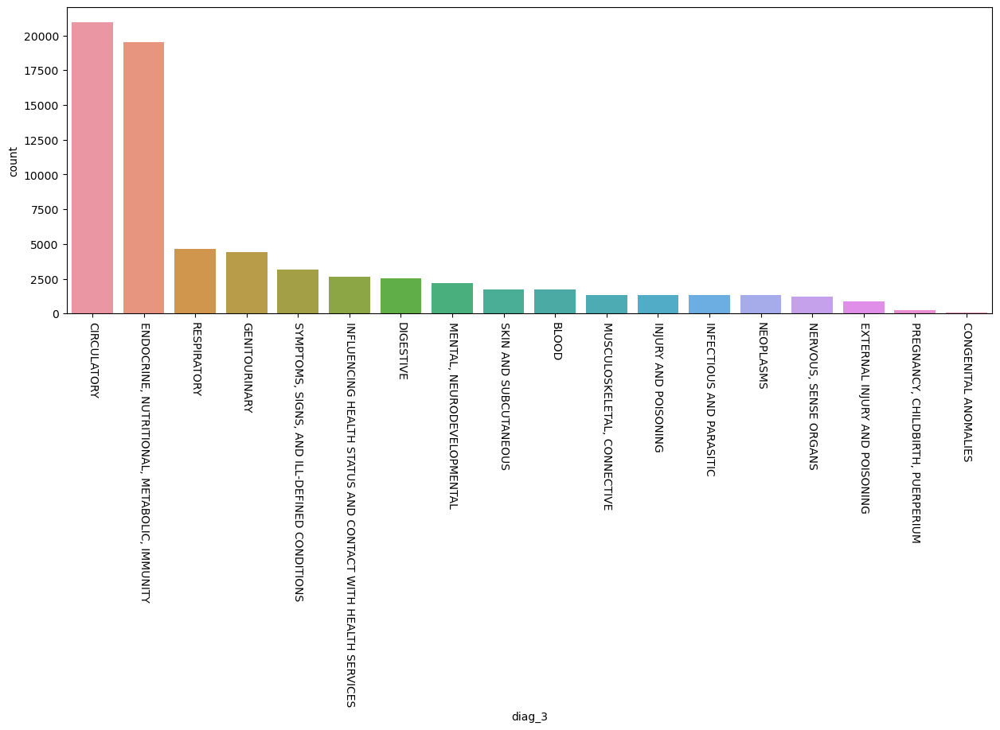

In [61]:
fig,ax=plt.subplots(figsize=(15,5))

sns.countplot(x=train_df['diag_3'], order=train_df['diag_3'].value_counts().index, ax=ax)
_ = plt.xticks(rotation=-90)

##### `number_diagnoses`

As shown below, number of diagonses entered into the system range from 1 to 16 and it's between 7 and 8 in average.

In [62]:
round(train_df['number_diagnoses'].value_counts(normalize=True)*100, 2)

9     48.47
5     11.21
8     10.46
7     10.27
6     10.04
4      5.48
3      2.74
2      1.03
1      0.20
16     0.04
13     0.02
10     0.02
11     0.01
15     0.01
12     0.01
14     0.01
Name: number_diagnoses, dtype: float64

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  This is separate from the ipykernel package so we can avoid doing imports until


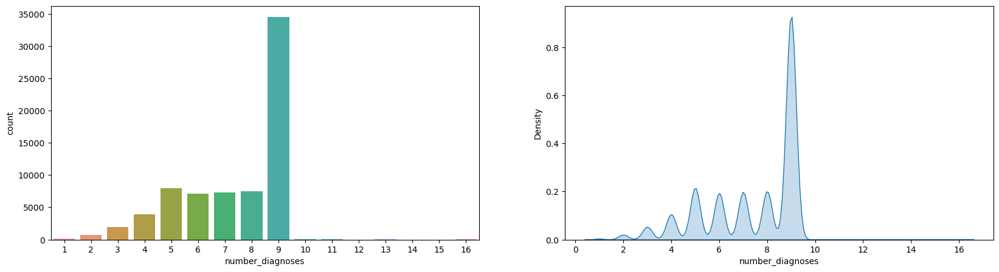

In [63]:
figure, subplots = plt.subplots(1, 2, figsize=(20, 5))
_ = sns.countplot(x=train_df['number_diagnoses'], ax=subplots[0])
_ = sns.kdeplot(train_df['number_diagnoses'], shade=True, ax=subplots[1])

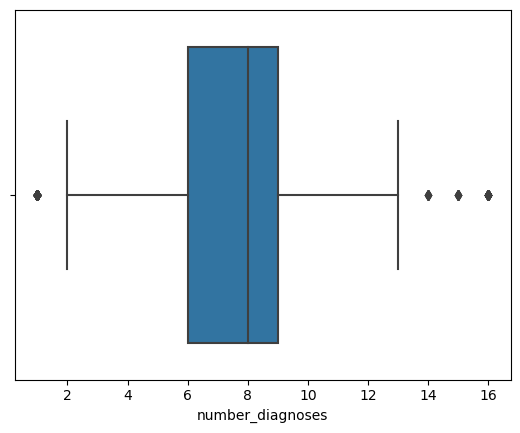

In [64]:
_ = sns.boxplot(x=train_df['number_diagnoses'])

##### `max_glu_serum`

As demonstrated, almost `95%` of patients have not been tested for the `max_glu_serum` test.

In [65]:
train_df['max_glu_serum'].value_counts(normalize=True)

None    0.946881
Norm    0.025998
>200    0.014613
>300    0.012508
Name: max_glu_serum, dtype: float64

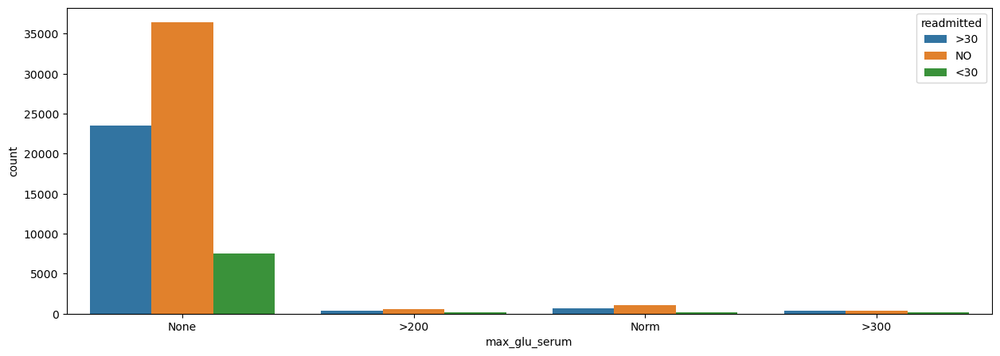

In [66]:
fig,ax=plt.subplots(figsize=(15,5))

_ = sns.countplot(x=train_df['max_glu_serum'],hue=train_df['readmitted'],ax=ax) 

##### `A1Cresult`

As demonstrated, almost `84%` of patients have not been tested for the `A1C` test.

In [67]:
train_df['A1Cresult'].value_counts(normalize=True)

None    0.833736
>8      0.080704
Norm    0.048473
>7      0.037088
Name: A1Cresult, dtype: float64

Most of patients that have not been tested for the `A1C` test didn't readmit or readmitted after 30 days.

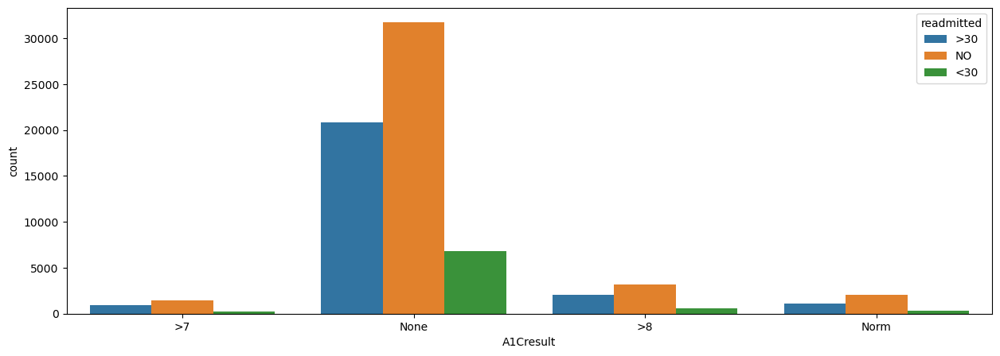

In [68]:
fig,ax=plt.subplots(figsize=(15,5))

_ = sns.countplot(x=train_df['A1Cresult'],hue=train_df['readmitted'],ax=ax) 

##### `change`

Almost equal distribution for `change`
<!--  -->
- `54%` of patients don't change their neither medicine or dosage.

- `46%` of patients change their either medicine or dosage.

In [69]:
round(train_df['change'].value_counts(normalize=True)*100, 2)

No    53.85
Ch    46.15
Name: change, dtype: float64

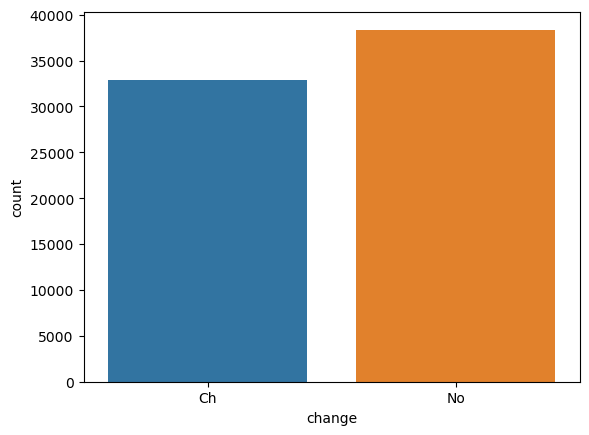

In [70]:
_ = sns.countplot(x=train_df['change'])

##### `diabetesMed`

Almost `77%` of patients have prescribed diabetic medication 

In [71]:
round(train_df['diabetesMed'].value_counts(normalize=True)*100, 2)

Yes    77.2
No     22.8
Name: diabetesMed, dtype: float64

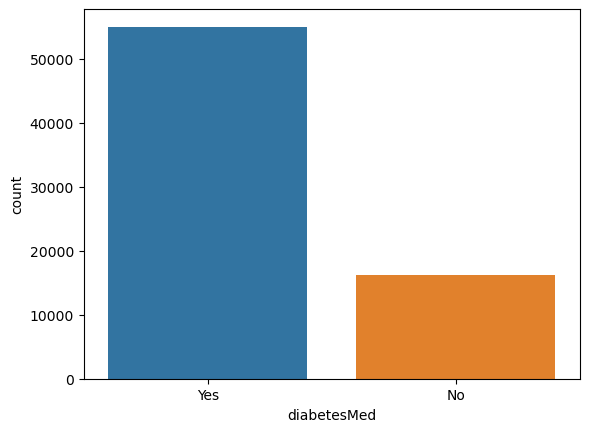

In [72]:
_ = sns.countplot(x=train_df['diabetesMed'])

##### `features for medications`

As demonstrated below from `train_df.info()`, we can see indices range of features of medications starts from `metformin` and ends at `metformin-pioglitazone`.

In [73]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 71236 entries, 0 to 71235
Data columns (total 47 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   encounter_id              71236 non-null  int64 
 1   patient_nbr               71236 non-null  int64 
 2   race                      71236 non-null  object
 3   gender                    71236 non-null  object
 4   age                       71236 non-null  int64 
 5   time_in_hospital          71236 non-null  int64 
 6   num_lab_procedures        71236 non-null  int64 
 7   num_procedures            71236 non-null  int64 
 8   num_medications           71236 non-null  int64 
 9   number_outpatient         71236 non-null  int64 
 10  number_emergency          71236 non-null  int64 
 11  number_inpatient          71236 non-null  int64 
 12  diag_1                    71236 non-null  object
 13  diag_2                    71236 non-null  object
 14  diag_3                

Or we can have some more fun and visualize it as follows in the next cell

In [74]:
dict(zip(train_df.columns, range(len(train_df.columns))))

{'encounter_id': 0,
 'patient_nbr': 1,
 'race': 2,
 'gender': 3,
 'age': 4,
 'time_in_hospital': 5,
 'num_lab_procedures': 6,
 'num_procedures': 7,
 'num_medications': 8,
 'number_outpatient': 9,
 'number_emergency': 10,
 'number_inpatient': 11,
 'diag_1': 12,
 'diag_2': 13,
 'diag_3': 14,
 'number_diagnoses': 15,
 'max_glu_serum': 16,
 'A1Cresult': 17,
 'metformin': 18,
 'repaglinide': 19,
 'nateglinide': 20,
 'chlorpropamide': 21,
 'glimepiride': 22,
 'acetohexamide': 23,
 'glipizide': 24,
 'glyburide': 25,
 'tolbutamide': 26,
 'pioglitazone': 27,
 'rosiglitazone': 28,
 'acarbose': 29,
 'miglitol': 30,
 'troglitazone': 31,
 'tolazamide': 32,
 'examide': 33,
 'citoglipton': 34,
 'insulin': 35,
 'glyburide-metformin': 36,
 'glipizide-metformin': 37,
 'glimepiride-pioglitazone': 38,
 'metformin-rosiglitazone': 39,
 'metformin-pioglitazone': 40,
 'change': 41,
 'diabetesMed': 42,
 'readmitted': 43,
 'admission_type': 44,
 'discharge_disposition': 45,
 'admission_source': 46}

Let's combine them in one dataframe for better analysis.
<!--  -->
we'll use get_loc to instead of setting indices explicitly to be invariant for any changes later.

In [75]:
medications_train_df = train_df.iloc[:, train_df.columns.get_loc('metformin') : train_df.columns.get_loc('metformin-pioglitazone')+1]
medications_test_df = test_df.iloc[:, test_df.columns.get_loc('metformin') : test_df.columns.get_loc('metformin-pioglitazone')+1]

medications_train_df.head()

,metformin,repaglinide,nateglinide,chlorpropamide,glimepiride,acetohexamide,glipizide,glyburide,tolbutamide,pioglitazone,...,troglitazone,tolazamide,examide,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone
0,No,No,No,No,No,No,Steady,No,No,No,...,No,No,No,No,No,No,No,No,No,No
1,No,No,No,No,No,No,No,Steady,No,No,...,No,No,No,No,No,No,No,No,No,No
2,No,No,No,No,No,No,No,No,No,No,...,No,No,No,No,Up,No,No,No,No,No
3,No,No,No,No,No,No,No,No,No,No,...,No,No,No,No,No,No,No,No,No,No
4,No,No,No,No,No,No,No,No,No,No,...,No,No,No,No,Steady,No,No,No,No,No


Now, let's see distribution of every medication

Here we can see:
- `examide, citoglipton, metformin-rosiglitazone` are not prescribed for any patient, so we can drop them.

- The most prescribed medicine for patients is the `insulin`, which makes sense.

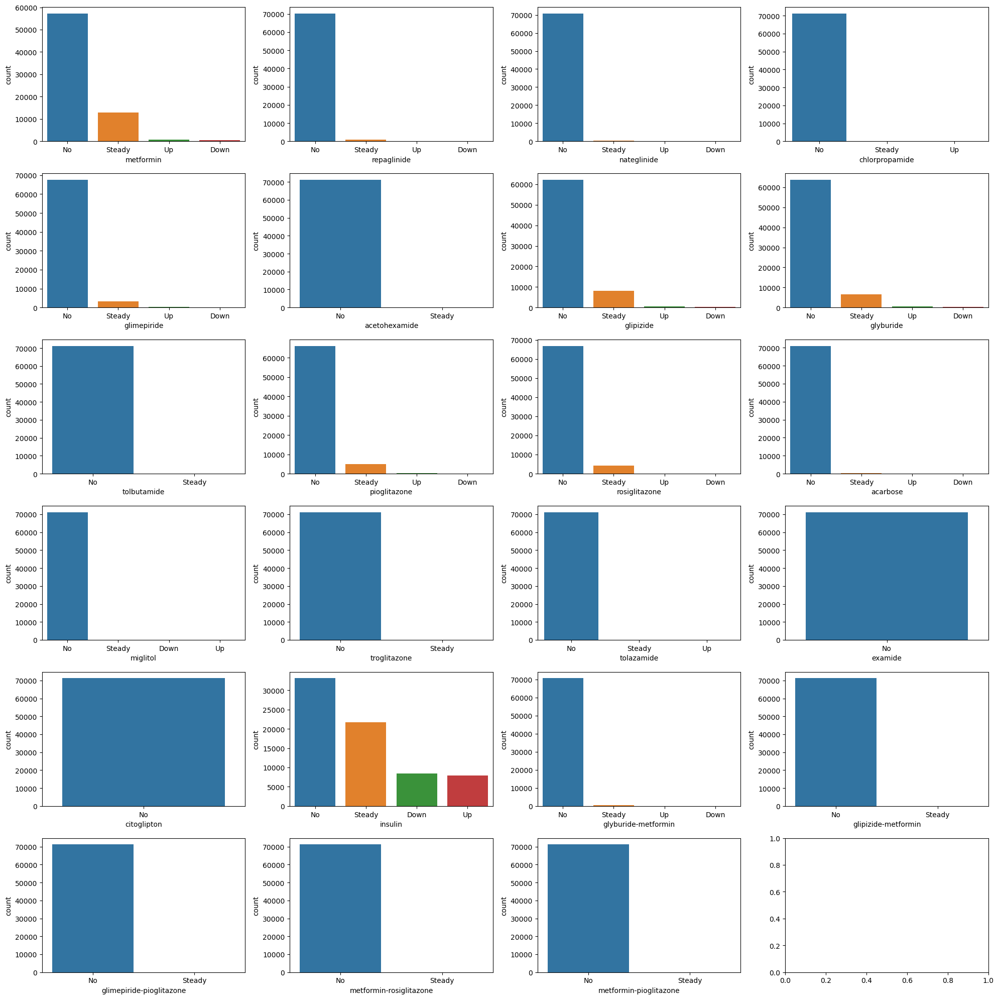

In [76]:
n_cols = 4
fig, subplots = plt.subplots(int(np.ceil(medications_train_df.shape[1]/n_cols)), n_cols, figsize=(20, 20))

for ax, medication in zip(subplots.flatten(), medications_train_df):
  sns.countplot(x=medications_train_df[medication], order=medications_train_df[medication].value_counts().index, ax=ax)

plt.tight_layout()

Drop `examide, citoglipton, metformin-rosiglitazone`.

In [77]:
train_df = train_df.drop(columns=['examide', 'citoglipton', 'metformin-rosiglitazone'])
test_df = test_df.drop(columns=['examide', 'citoglipton', 'metformin-rosiglitazone'])

medications_train_df = medications_train_df.drop(columns=['examide', 'citoglipton', 'metformin-rosiglitazone'])
medications_test_df = medications_test_df.drop(columns=['examide', 'citoglipton', 'metformin-rosiglitazone'])

But we can see also some medications are assigned for few patients. So let's see percentages of medications.
<!--  -->
As you can see below if we look at `metformin` for example, around `80%` of patients are `not` taking it, while `0.58%` are taking it with their usual dosage, `18%` are taking it with decreased dosage and `1%` are taking it with increased dosage.

In [78]:
medications_percentages_train_df = (medications_train_df.apply(pd.Series.value_counts)/len(train_df)*100).T
medications_percentages_test_df = (medications_test_df.apply(pd.Series.value_counts)/len(test_df)*100).T

medications_percentages_train_df

,Down,No,Steady,Up
metformin,0.583974,80.314729,18.034421,1.066876
repaglinide,0.047729,98.520411,1.333595,0.098265
nateglinide,0.009826,99.288281,0.675220,0.026672
chlorpropamide,NaN,99.912965,0.082823,0.004211
glimepiride,0.193722,94.918300,4.570723,0.317255
acetohexamide,NaN,99.998596,0.001404,NaN
glipizide,0.579763,87.372957,11.280813,0.766466
glyburide,0.541861,89.582514,9.088102,0.787523
tolbutamide,NaN,99.977539,0.022461,NaN
pioglitazone,0.102476,92.773317,6.872929,0.251277


Let's focus on percentage of prescribed medications.

In [79]:
medications_percentages_train_df.drop(columns='No').sum(1)

metformin                   19.685271
repaglinide                  1.479589
nateglinide                  0.711719
chlorpropamide               0.087035
glimepiride                  5.081700
acetohexamide                0.001404
glipizide                   12.627043
glyburide                   10.417486
tolbutamide                  0.022461
pioglitazone                 7.226683
rosiglitazone                6.225785
acarbose                     0.325678
miglitol                     0.039306
troglitazone                 0.004211
tolazamide                   0.044921
insulin                     53.502443
glyburide-metformin          0.724353
glipizide-metformin          0.012634
glimepiride-pioglitazone     0.001404
metformin-pioglitazone       0.001404
dtype: float64

Let's get medications that prescribed for more than 10% of patients, which are `metformin, glipizide, glyburide, insulin`.

In [80]:
medications_percentages_train_df[medications_percentages_train_df.drop(columns='No').sum(1).values > 10]

,Down,No,Steady,Up
metformin,0.583974,80.314729,18.034421,1.066876
glipizide,0.579763,87.372957,11.280813,0.766466
glyburide,0.541861,89.582514,9.088102,0.787523
insulin,11.918131,46.497557,30.476164,11.108148


Not let's drop the others medications.

In [81]:
medications_to_drop = medications_percentages_train_df[medications_percentages_train_df.drop(columns='No').sum(1).values < 10].index
medications_to_drop

Index(['repaglinide', 'nateglinide', 'chlorpropamide', 'glimepiride',
       'acetohexamide', 'tolbutamide', 'pioglitazone', 'rosiglitazone',
       'acarbose', 'miglitol', 'troglitazone', 'tolazamide',
       'glyburide-metformin', 'glipizide-metformin',
       'glimepiride-pioglitazone', 'metformin-pioglitazone'],
      dtype='object')

In [82]:
train_df = train_df.drop(columns=medications_to_drop)
test_df = test_df.drop(columns=medications_to_drop)

medications_train_df = medications_train_df.drop(columns=medications_to_drop)
medications_test_df = medications_test_df.drop(columns=medications_to_drop)

In [83]:
medications_train_df.head()

,metformin,glipizide,glyburide,insulin
0,No,Steady,No,No
1,No,No,Steady,No
2,No,No,No,Up
3,No,No,No,No
4,No,No,No,Steady


Distribution of every medication with respect to target label `readmitted`

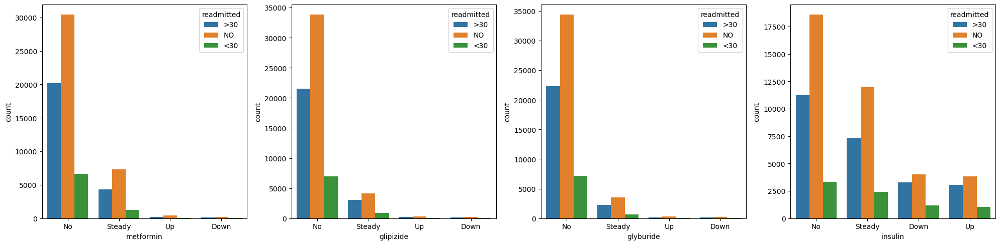

In [84]:
n_cols = 4
fig, subplots = plt.subplots(int(np.ceil(medications_train_df.shape[1]/n_cols)), n_cols, figsize=(20, 5))

for ax, medication in zip(subplots.flatten(), medications_train_df):
  sns.countplot(x=medications_train_df[medication], order=medications_train_df[medication].value_counts().index, hue=train_df['readmitted'], ax=ax)

plt.tight_layout()

##### `readmitted`

In [85]:
round(train_df['readmitted'].value_counts(normalize=True)*100, 2)

NO     53.91
>30    34.93
<30    11.16
Name: readmitted, dtype: float64

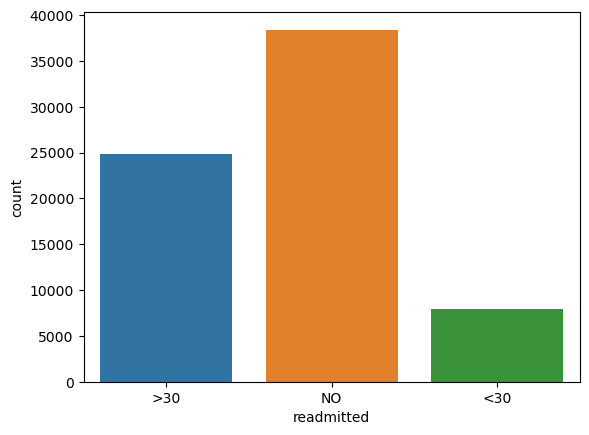

In [86]:
_ = sns.countplot(x=train_df['readmitted'])

## Feature Extraction

In [87]:
train_df.head()

,encounter_id,patient_nbr,race,gender,age,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,...,metformin,glipizide,glyburide,insulin,change,diabetesMed,readmitted,admission_type,discharge_disposition,admission_source
0,197920182,110382426,Caucasian,Female,85,5,40,2,25,0,...,No,Steady,No,No,Ch,Yes,>30,Elective,Home,Emergency
1,30870324,1276911,Caucasian,Male,75,3,22,1,22,0,...,No,No,Steady,No,No,Yes,NO,Elective,Other,Referral
2,126616944,92115693,Caucasian,Female,75,8,33,5,5,0,...,No,No,No,Up,Ch,Yes,NO,Elective,Other,Referral
3,303646118,32010471,Caucasian,Male,55,7,52,1,15,0,...,No,No,No,No,No,No,>30,Unknown,Home,Emergency
4,109444026,2402271,Caucasian,Male,45,2,47,2,10,0,...,No,No,No,Steady,No,Yes,NO,Emergency,Home,Transfer


In [88]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 71236 entries, 0 to 71235
Data columns (total 28 columns):
 #   Column                 Non-Null Count  Dtype 
---  ------                 --------------  ----- 
 0   encounter_id           71236 non-null  int64 
 1   patient_nbr            71236 non-null  int64 
 2   race                   71236 non-null  object
 3   gender                 71236 non-null  object
 4   age                    71236 non-null  int64 
 5   time_in_hospital       71236 non-null  int64 
 6   num_lab_procedures     71236 non-null  int64 
 7   num_procedures         71236 non-null  int64 
 8   num_medications        71236 non-null  int64 
 9   number_outpatient      71236 non-null  int64 
 10  number_emergency       71236 non-null  int64 
 11  number_inpatient       71236 non-null  int64 
 12  diag_1                 71236 non-null  object
 13  diag_2                 71236 non-null  object
 14  diag_3                 71236 non-null  object
 15  number_diagnoses   

##### `preceding_year_visits`

Let's merge number of `outpatient`, `inpatient` and `emergency` visits of the patient in the year preceding the encounter in one column, `preceding_year_visits`.

In [89]:
train_df['preceding_year_visits'] = train_df['number_outpatient'] + train_df['number_emergency'] + train_df['number_inpatient']
test_df['preceding_year_visits'] = test_df['number_outpatient'] + test_df['number_emergency'] + test_df['number_inpatient']

train_df[['preceding_year_visits']].head()

,preceding_year_visits
0,0
1,0
2,0
3,4
4,1


In [90]:
# train_df = train_df.drop(columns=['number_outpatient', 'number_emergency', 'number_inpatient'])
# test_df = test_df.drop(columns=['number_outpatient', 'number_emergency', 'number_inpatient'])

# train_df.info()

##### The number of times the medication is changed, `number_changes`


count number of increasing (`Up`) or decreasing (`Down`) in dosage.

In [91]:
medications_value_counts_train_df = (train_df[['metformin', 'glipizide', 'glyburide', 'insulin']]).apply(pd.Series.value_counts, axis=1)
medications_value_counts_test_df = (test_df[['metformin', 'glipizide', 'glyburide', 'insulin']]).apply(pd.Series.value_counts, axis=1)

medications_value_counts_train_df.head()

,Down,No,Steady,Up
0,NaN,3.0,1.0,NaN
1,NaN,3.0,1.0,NaN
2,NaN,3.0,NaN,1.0
3,NaN,4.0,NaN,NaN
4,NaN,3.0,1.0,NaN


In [92]:
train_df['number_changes'] = medications_value_counts_train_df[['Down', 'Up']].sum(1).astype('int')
test_df['number_changes'] = medications_value_counts_test_df[['Down', 'Up']].sum(1).astype('int')

train_df[['number_changes']].head()

,number_changes
0,0
1,0
2,1
3,0
4,0


Drop `change` column as `number_changes` is more representative.

In [93]:
train_df = train_df.drop(columns='change')
test_df = test_df.drop(columns='change')

train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 71236 entries, 0 to 71235
Data columns (total 29 columns):
 #   Column                 Non-Null Count  Dtype 
---  ------                 --------------  ----- 
 0   encounter_id           71236 non-null  int64 
 1   patient_nbr            71236 non-null  int64 
 2   race                   71236 non-null  object
 3   gender                 71236 non-null  object
 4   age                    71236 non-null  int64 
 5   time_in_hospital       71236 non-null  int64 
 6   num_lab_procedures     71236 non-null  int64 
 7   num_procedures         71236 non-null  int64 
 8   num_medications        71236 non-null  int64 
 9   number_outpatient      71236 non-null  int64 
 10  number_emergency       71236 non-null  int64 
 11  number_inpatient       71236 non-null  int64 
 12  diag_1                 71236 non-null  object
 13  diag_2                 71236 non-null  object
 14  diag_3                 71236 non-null  object
 15  number_diagnoses   

##### `cummlative_features for patient`

<!-- ##### `cummlative_time_in_hospital, cummlative_number_diagnoses, cummlative_num_medications, cummlative_num_procedures, cummlative_num_lab_procedures, cummlative_number_inpatient, cummlative_number_inpatient, cummlative_number_emergency, cummlative_number_outpatient` -->

In [94]:
to_extract_features = ['time_in_hospital', 'number_diagnoses', 'num_medications', 'num_procedures', 'num_lab_procedures', 'number_inpatient', 'number_emergency', 'number_outpatient', 'preceding_year_visits', 'number_changes']
merged_df = pd.concat([train_df, test_df])
merged_df['number_visits'] = merged_df['patient_nbr'].map(merged_df['patient_nbr'].value_counts())

for feature in to_extract_features:
  merged_df[f'cummlative_{feature}'] = merged_df['patient_nbr'].map(merged_df.groupby('patient_nbr').sum()[f'{feature}'])
  
test_df = merged_df[merged_df['readmitted'].isna()]
del test_df['readmitted']
train_df = merged_df[merged_df['readmitted'].notna()]

## More Exploration

##### Correlation

We can't realize any correlation between numerical features here.

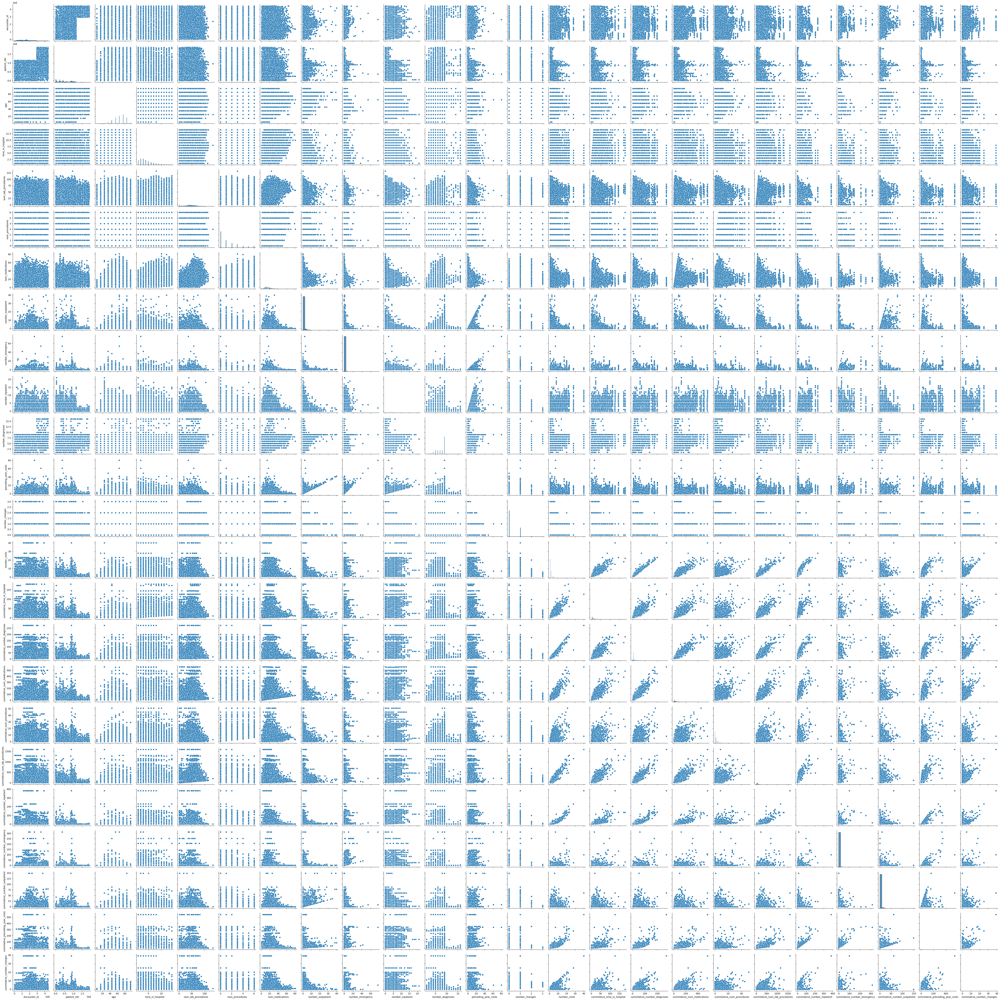

In [95]:
_ = sns.pairplot(train_df)

Let's explore correlation from heatmap.
<!--  -->
We can see the highest correlation is between `time_in_hospital` and `num_medications` as the more time the patient is in hospital, the more number of medications he has.

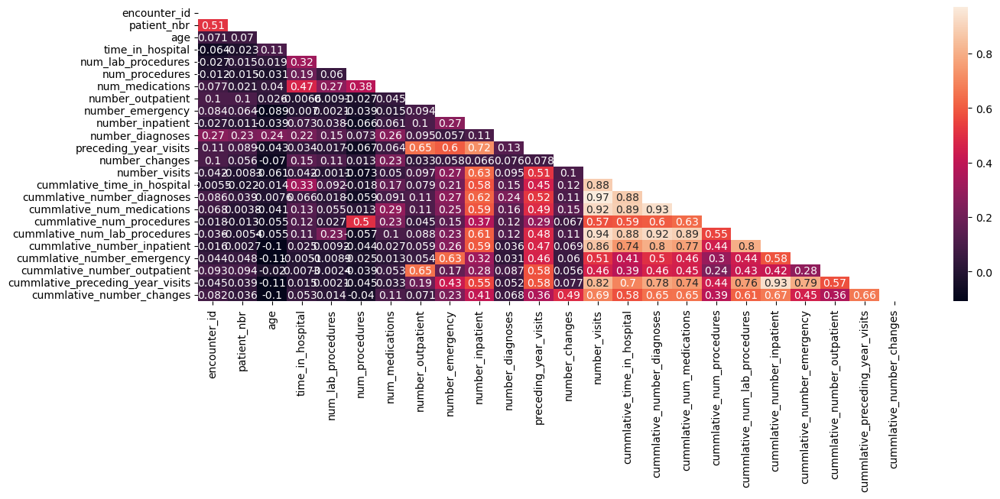

In [96]:
fig, subplot = plt.subplots(figsize=(15,5))

corr= train_df.corr()

# Getting the Upper Triangle of the co-relation matrix
matrix = np.triu(corr)

# using the upper triangle matrix as mask 
_ = sns.heatmap(corr, annot=True, mask=matrix, ax=subplot)

##### `diabetesMed` with `medications`

As we see, it's reasonable that none of the patients that don't take any diabetes medications take any of the following medications: `metformin, glipizide, glyburide, insulin`, that confirms on that these are the most important medications for diabetes.

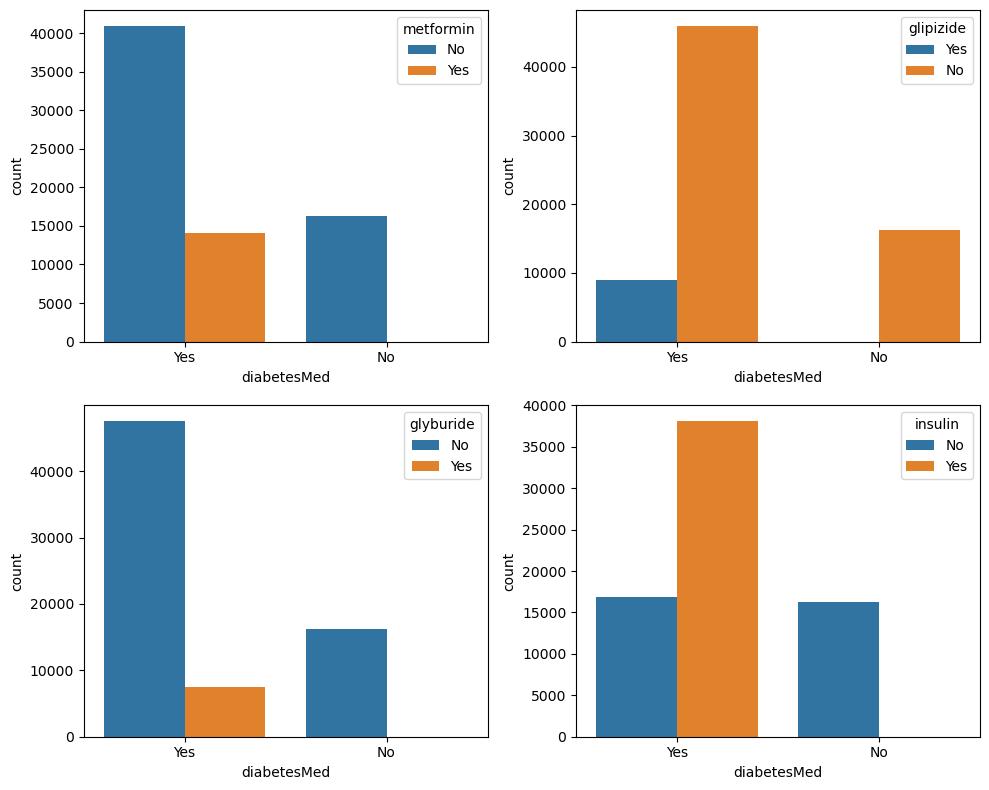

In [97]:
n_cols = 2
fig, subplots = plt.subplots(int(np.ceil(medications_train_df.shape[1]/n_cols)), n_cols, figsize=(10, 8))

for ax, medication in zip(subplots.flatten(), medications_train_df):
  _ = sns.countplot(x=train_df['diabetesMed'], hue=train_df[medication].replace({'Steady':'Yes',
                                                                  'Up': 'Yes',
                                                                  'Down': 'Yes'}), ax=ax)
plt.tight_layout()

## Feature Transformation

In [98]:
train_df = train_df.reset_index(drop=True)
test_df = test_df.reset_index(drop=True)

In [99]:
# num_cols = ['age', 'time_in_hospital', 'num_lab_procedures', 'num_procedures', 'num_medications',
#             'number_diagnoses','preceding_year_visits']

num_cols = train_df.drop(columns=['encounter_id',	'patient_nbr']).select_dtypes('number').columns
num_cols

Index(['age', 'time_in_hospital', 'num_lab_procedures', 'num_procedures',
       'num_medications', 'number_outpatient', 'number_emergency',
       'number_inpatient', 'number_diagnoses', 'preceding_year_visits',
       'number_changes', 'number_visits', 'cummlative_time_in_hospital',
       'cummlative_number_diagnoses', 'cummlative_num_medications',
       'cummlative_num_procedures', 'cummlative_num_lab_procedures',
       'cummlative_number_inpatient', 'cummlative_number_emergency',
       'cummlative_number_outpatient', 'cummlative_preceding_year_visits',
       'cummlative_number_changes'],
      dtype='object')

In [100]:
from sklearn.preprocessing import RobustScaler

scaler = RobustScaler()
train_df[num_cols] = pd.DataFrame(scaler.fit_transform(train_df[num_cols]), columns = num_cols)
test_df[num_cols] = pd.DataFrame(scaler.transform(test_df[num_cols]), columns = num_cols)

In [101]:
train_df.head()

,encounter_id,patient_nbr,race,gender,age,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,...,cummlative_time_in_hospital,cummlative_number_diagnoses,cummlative_num_medications,cummlative_num_procedures,cummlative_num_lab_procedures,cummlative_number_inpatient,cummlative_number_emergency,cummlative_number_outpatient,cummlative_preceding_year_visits,cummlative_number_changes
0,197920182,110382426,Caucasian,Female,1.0,0.25,-0.153846,0.5,1.0,0.0,...,2.222222,2.454545,2.800000,0.75,2.458333,1.0,0.0,0.0,0.333333,3.0
1,30870324,1276911,Caucasian,Male,0.5,-0.25,-0.846154,0.0,0.7,0.0,...,-0.333333,-0.090909,-0.033333,-0.25,-0.555556,0.0,0.0,0.0,-0.333333,0.0
2,126616944,92115693,Caucasian,Female,0.5,1.00,-0.423077,2.0,-1.0,0.0,...,0.222222,0.000000,-0.600000,0.75,-0.402778,0.0,0.0,0.0,-0.333333,1.0
3,303646118,32010471,Caucasian,Male,-0.5,0.75,0.307692,0.0,0.0,0.0,...,0.111111,-0.272727,-0.266667,-0.25,-0.138889,2.0,0.0,0.0,1.000000,0.0
4,109444026,2402271,Caucasian,Male,-1.0,-0.50,0.115385,0.5,-0.5,0.0,...,-0.222222,0.090909,0.000000,0.25,0.500000,0.5,0.0,0.0,0.000000,0.0


## Encoding

##### `race`

In [102]:
race_train_df = pd.get_dummies(train_df['race'], drop_first=True)
train_df[race_train_df.columns] = race_train_df
train_df = train_df.drop(columns='race')

race_test_df = pd.get_dummies(test_df['race'], drop_first=True)
test_df[race_test_df.columns] = race_test_df
test_df = test_df.drop(columns='race')

# from sklearn.preprocessing import OneHotEncoder
# one_hot_encoder = OneHotEncoder(sparse_output=False).set_output(transform="pandas")
# one_hot_encoded = one_hot_encoder.fit_transform(train_df[['race']])
# train_df = pd.concat([train_df,one_hot_encoded],axis=1).drop(columns=['race'])

# one_hot_encoded = one_hot_encoder.transform(test_df[['race']])
# test_df = pd.concat([test_df,one_hot_encoded],axis=1).drop(columns=['race'])

train_df.head()

,encounter_id,patient_nbr,gender,age,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,...,cummlative_num_medications,cummlative_num_procedures,cummlative_num_lab_procedures,cummlative_number_inpatient,cummlative_number_emergency,cummlative_number_outpatient,cummlative_preceding_year_visits,cummlative_number_changes,Caucasian,Other
0,197920182,110382426,Female,1.0,0.25,-0.153846,0.5,1.0,0.0,0.0,...,2.800000,0.75,2.458333,1.0,0.0,0.0,0.333333,3.0,1,0
1,30870324,1276911,Male,0.5,-0.25,-0.846154,0.0,0.7,0.0,0.0,...,-0.033333,-0.25,-0.555556,0.0,0.0,0.0,-0.333333,0.0,1,0
2,126616944,92115693,Female,0.5,1.00,-0.423077,2.0,-1.0,0.0,0.0,...,-0.600000,0.75,-0.402778,0.0,0.0,0.0,-0.333333,1.0,1,0
3,303646118,32010471,Male,-0.5,0.75,0.307692,0.0,0.0,0.0,0.0,...,-0.266667,-0.25,-0.138889,2.0,0.0,0.0,1.000000,0.0,1,0
4,109444026,2402271,Male,-1.0,-0.50,0.115385,0.5,-0.5,0.0,0.0,...,0.000000,0.25,0.500000,0.5,0.0,0.0,0.000000,0.0,1,0


##### `gender`

In [103]:
train_df['gender'] = train_df['gender'].replace({'Female' : 0, 'Male' : 1})
test_df['gender'] = test_df['gender'].replace({'Female' : 0, 'Male' : 1})

##### `admission_type_id`

In [104]:
train_df['admission_type'] = train_df['admission_type'].replace({'Unknown' : 0, 'Elective' : 1, 'Emergency' : 2})
test_df['admission_type'] = test_df['admission_type'].replace({'Unknown' : 0, 'Elective' : 1, 'Emergency' : 2})

##### `discharge_disposition`

In [105]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
train_df['discharge_disposition'] = label_encoder.fit_transform(train_df['discharge_disposition'])
test_df['discharge_disposition'] = label_encoder.fit_transform(test_df['discharge_disposition'])

train_df.head()

,encounter_id,patient_nbr,gender,age,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,...,cummlative_num_medications,cummlative_num_procedures,cummlative_num_lab_procedures,cummlative_number_inpatient,cummlative_number_emergency,cummlative_number_outpatient,cummlative_preceding_year_visits,cummlative_number_changes,Caucasian,Other
0,197920182,110382426,0,1.0,0.25,-0.153846,0.5,1.0,0.0,0.0,...,2.800000,0.75,2.458333,1.0,0.0,0.0,0.333333,3.0,1,0
1,30870324,1276911,1,0.5,-0.25,-0.846154,0.0,0.7,0.0,0.0,...,-0.033333,-0.25,-0.555556,0.0,0.0,0.0,-0.333333,0.0,1,0
2,126616944,92115693,0,0.5,1.00,-0.423077,2.0,-1.0,0.0,0.0,...,-0.600000,0.75,-0.402778,0.0,0.0,0.0,-0.333333,1.0,1,0
3,303646118,32010471,1,-0.5,0.75,0.307692,0.0,0.0,0.0,0.0,...,-0.266667,-0.25,-0.138889,2.0,0.0,0.0,1.000000,0.0,1,0
4,109444026,2402271,1,-1.0,-0.50,0.115385,0.5,-0.5,0.0,0.0,...,0.000000,0.25,0.500000,0.5,0.0,0.0,0.000000,0.0,1,0


##### `admission_source_id`

In [106]:
train_df['admission_source'].value_counts()

Emergency    40195
Referral     21608
Unknown       5010
Transfer      4407
Delivery        16
Name: admission_source, dtype: int64

In [107]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
train_df['admission_source'] = label_encoder.fit_transform(train_df['admission_source'])
test_df['admission_source'] = label_encoder.fit_transform(test_df['admission_source'])

train_df.head()

,encounter_id,patient_nbr,gender,age,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,...,cummlative_num_medications,cummlative_num_procedures,cummlative_num_lab_procedures,cummlative_number_inpatient,cummlative_number_emergency,cummlative_number_outpatient,cummlative_preceding_year_visits,cummlative_number_changes,Caucasian,Other
0,197920182,110382426,0,1.0,0.25,-0.153846,0.5,1.0,0.0,0.0,...,2.800000,0.75,2.458333,1.0,0.0,0.0,0.333333,3.0,1,0
1,30870324,1276911,1,0.5,-0.25,-0.846154,0.0,0.7,0.0,0.0,...,-0.033333,-0.25,-0.555556,0.0,0.0,0.0,-0.333333,0.0,1,0
2,126616944,92115693,0,0.5,1.00,-0.423077,2.0,-1.0,0.0,0.0,...,-0.600000,0.75,-0.402778,0.0,0.0,0.0,-0.333333,1.0,1,0
3,303646118,32010471,1,-0.5,0.75,0.307692,0.0,0.0,0.0,0.0,...,-0.266667,-0.25,-0.138889,2.0,0.0,0.0,1.000000,0.0,1,0
4,109444026,2402271,1,-1.0,-0.50,0.115385,0.5,-0.5,0.0,0.0,...,0.000000,0.25,0.500000,0.5,0.0,0.0,0.000000,0.0,1,0


In [108]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 71236 entries, 0 to 71235
Data columns (total 41 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   encounter_id                      71236 non-null  int64  
 1   patient_nbr                       71236 non-null  int64  
 2   gender                            71236 non-null  int64  
 3   age                               71236 non-null  float64
 4   time_in_hospital                  71236 non-null  float64
 5   num_lab_procedures                71236 non-null  float64
 6   num_procedures                    71236 non-null  float64
 7   num_medications                   71236 non-null  float64
 8   number_outpatient                 71236 non-null  float64
 9   number_emergency                  71236 non-null  float64
 10  number_inpatient                  71236 non-null  float64
 11  diag_1                            71236 non-null  object 
 12  diag

##### `diag_1`, `diag_2`, `diag_3`

In [109]:
from sklearn.preprocessing import LabelEncoder

for i in range(3):
  column = f'diag_{i+1}'
  label_encoder = LabelEncoder()
  train_df[column] = label_encoder.fit_transform(train_df[column])
  test_df[column] = label_encoder.fit_transform(test_df[column])

train_df.head()

,encounter_id,patient_nbr,gender,age,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,...,cummlative_num_medications,cummlative_num_procedures,cummlative_num_lab_procedures,cummlative_number_inpatient,cummlative_number_emergency,cummlative_number_outpatient,cummlative_preceding_year_visits,cummlative_number_changes,Caucasian,Other
0,197920182,110382426,0,1.0,0.25,-0.153846,0.5,1.0,0.0,0.0,...,2.800000,0.75,2.458333,1.0,0.0,0.0,0.333333,3.0,1,0
1,30870324,1276911,1,0.5,-0.25,-0.846154,0.0,0.7,0.0,0.0,...,-0.033333,-0.25,-0.555556,0.0,0.0,0.0,-0.333333,0.0,1,0
2,126616944,92115693,0,0.5,1.00,-0.423077,2.0,-1.0,0.0,0.0,...,-0.600000,0.75,-0.402778,0.0,0.0,0.0,-0.333333,1.0,1,0
3,303646118,32010471,1,-0.5,0.75,0.307692,0.0,0.0,0.0,0.0,...,-0.266667,-0.25,-0.138889,2.0,0.0,0.0,1.000000,0.0,1,0
4,109444026,2402271,1,-1.0,-0.50,0.115385,0.5,-0.5,0.0,0.0,...,0.000000,0.25,0.500000,0.5,0.0,0.0,0.000000,0.0,1,0


##### `max_glu_serum`

In [110]:
max_glu_serum_train_df = pd.get_dummies(train_df['max_glu_serum'], prefix='max_glu_serum', drop_first=True)
train_df[max_glu_serum_train_df.columns] = max_glu_serum_train_df
train_df = train_df.drop(columns='max_glu_serum')

max_glu_serum_test_df = pd.get_dummies(test_df['max_glu_serum'], prefix='max_glu_serum', drop_first=True)
test_df[max_glu_serum_test_df.columns] = max_glu_serum_test_df
test_df = test_df.drop(columns='max_glu_serum')

# from sklearn.preprocessing import OneHotEncoder
# one_hot_encoder = OneHotEncoder(sparse_output=False).set_output(transform="pandas")
# one_hot_encoded = one_hot_encoder.fit_transform(train_df[['max_glu_serum']])
# train_df = pd.concat([train_df,one_hot_encoded],axis=1).drop(columns=['max_glu_serum'])

# one_hot_encoded = one_hot_encoder.transform(test_df[['max_glu_serum']])
# test_df = pd.concat([test_df,one_hot_encoded],axis=1).drop(columns=['max_glu_serum'])

# train_df.head()

##### `A1Cresult`

In [111]:
A1Cresult_train_df = pd.get_dummies(train_df['A1Cresult'], prefix='A1Cresult', drop_first=True)
train_df[A1Cresult_train_df.columns] = A1Cresult_train_df
train_df = train_df.drop(columns='A1Cresult')

A1Cresult_test_df = pd.get_dummies(test_df['A1Cresult'], prefix='A1Cresult', drop_first=True)
test_df[A1Cresult_test_df.columns] = A1Cresult_test_df
test_df = test_df.drop(columns='A1Cresult')

# from sklearn.preprocessing import OneHotEncoder
# one_hot_encoder = OneHotEncoder(sparse_output=False).set_output(transform="pandas")
# one_hot_encoded = one_hot_encoder.fit_transform(train_df[['A1Cresult']])
# train_df = pd.concat([train_df,one_hot_encoded],axis=1).drop(columns=['A1Cresult'])

# one_hot_encoded = one_hot_encoder.transform(test_df[['A1Cresult']])
# test_df = pd.concat([test_df,one_hot_encoded],axis=1).drop(columns=['A1Cresult'])

train_df.head()

,encounter_id,patient_nbr,gender,age,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,...,cummlative_preceding_year_visits,cummlative_number_changes,Caucasian,Other,max_glu_serum_>300,max_glu_serum_None,max_glu_serum_Norm,A1Cresult_>8,A1Cresult_None,A1Cresult_Norm
0,197920182,110382426,0,1.0,0.25,-0.153846,0.5,1.0,0.0,0.0,...,0.333333,3.0,1,0,0,1,0,0,0,0
1,30870324,1276911,1,0.5,-0.25,-0.846154,0.0,0.7,0.0,0.0,...,-0.333333,0.0,1,0,0,1,0,0,1,0
2,126616944,92115693,0,0.5,1.00,-0.423077,2.0,-1.0,0.0,0.0,...,-0.333333,1.0,1,0,0,1,0,0,1,0
3,303646118,32010471,1,-0.5,0.75,0.307692,0.0,0.0,0.0,0.0,...,1.000000,0.0,1,0,0,0,0,0,1,0
4,109444026,2402271,1,-1.0,-0.50,0.115385,0.5,-0.5,0.0,0.0,...,0.000000,0.0,1,0,0,1,0,0,1,0


##### `change`

In [112]:
# train_df['change'] = train_df['change'].replace({'No' : 0, 'Ch' : 1})
# test_df['change'] = test_df['change'].replace({'No' : 0, 'Ch' : 1})

##### `diabetesMed`

Now let's encode values of `diabetesMed`, `Yes, NO` to `1, 0` respectively.

In [113]:
train_df['diabetesMed'] = train_df['diabetesMed'].replace({'Yes' : 1, 'No' : 0})
test_df['diabetesMed'] = test_df['diabetesMed'].replace({'Yes' : 1, 'No' : 0})

##### `features for medications`

Now let's encode values of medications features, `Up, Steady, Down, No`.

In [114]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
train_df[medications_train_df.columns] = train_df[medications_train_df.columns].apply(label_encoder.fit_transform)
test_df[medications_test_df.columns] = test_df[medications_test_df.columns].apply(label_encoder.transform)

##### `readmitted`

Now let's encode values of `readmitted`, `<30, >30, NO` to `2, 1, 0` respectively.

In [115]:
# train_df['readmitted'] = train_df['readmitted'].replace({
#                                              '<30': 2, 
#                                              '>30': 1,
#                                              'NO': 0
#                                              })

from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
train_df['readmitted'] = label_encoder.fit_transform(train_df['readmitted'])

## Data Splitting

In [116]:
to_drop_features = ['encounter_id', 'readmitted']

In [117]:
from sklearn.model_selection import train_test_split

train, validation = train_test_split(train_df, test_size=0.2, random_state=42, stratify=train_df['readmitted']) # Try adding `stratify` here

X_train = train.drop(columns=to_drop_features)
y_train = train['readmitted']

X_validation = validation.drop(columns=to_drop_features)
y_validation = validation['readmitted']


In [118]:
X_train

,patient_nbr,gender,age,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,...,cummlative_preceding_year_visits,cummlative_number_changes,Caucasian,Other,max_glu_serum_>300,max_glu_serum_None,max_glu_serum_Norm,A1Cresult_>8,A1Cresult_None,A1Cresult_Norm
34894,93889935,0,-0.5,0.75,0.384615,0.0,1.6,1.0,0.0,2.0,...,2.000000,5.0,1,0,0,1,0,0,1,0
16164,9110160,0,1.0,2.00,0.192308,-0.5,-1.1,0.0,0.0,1.0,...,0.000000,0.0,1,0,0,1,0,0,1,0
18601,85260492,0,1.0,0.25,1.461538,0.0,0.8,0.0,1.0,0.0,...,1.000000,0.0,1,0,0,1,0,0,1,0
11511,103335309,1,-1.5,-0.50,-0.538462,0.0,-0.7,0.0,2.0,0.0,...,0.666667,0.0,0,1,0,1,0,0,1,0
9595,19641411,0,1.0,-0.25,0.115385,-0.5,-0.5,0.0,0.0,0.0,...,-0.333333,1.0,1,0,0,1,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41718,94637529,1,0.5,0.00,-0.230769,0.0,0.3,1.0,0.0,0.0,...,1.000000,0.0,1,0,0,1,0,0,0,0
68944,67217904,1,0.0,1.50,1.615385,2.5,2.9,0.0,0.0,1.0,...,0.000000,0.0,0,1,0,1,0,0,1,0
11836,23829120,1,1.5,-0.25,-0.846154,-0.5,-0.8,0.0,0.0,0.0,...,-0.333333,0.0,1,0,0,0,1,0,1,0
36667,86501565,1,0.0,-0.25,-1.653846,-0.5,-0.5,0.0,0.0,1.0,...,0.000000,1.0,1,0,0,1,0,0,1,0


In [119]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 71236 entries, 0 to 71235
Data columns (total 45 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   encounter_id                      71236 non-null  int64  
 1   patient_nbr                       71236 non-null  int64  
 2   gender                            71236 non-null  int64  
 3   age                               71236 non-null  float64
 4   time_in_hospital                  71236 non-null  float64
 5   num_lab_procedures                71236 non-null  float64
 6   num_procedures                    71236 non-null  float64
 7   num_medications                   71236 non-null  float64
 8   number_outpatient                 71236 non-null  float64
 9   number_emergency                  71236 non-null  float64
 10  number_inpatient                  71236 non-null  float64
 11  diag_1                            71236 non-null  int64  
 12  diag

## Model Training

In [120]:
evaluation_df = pd.DataFrame()
models = {}

#### Random Forest

In [121]:
from sklearn.ensemble import RandomForestClassifier

# Create an instance of the classifier
randomForest_classifier = RandomForestClassifier(max_depth=5, random_state=0)

# Train the classifier
randomForest_classifier.fit(X_train, y_train)

RandomForestClassifier(max_depth=5, random_state=0)

In [122]:
model_name = 'Random Forest'
models[model_name] = randomForest_classifier
train_accuracy = randomForest_classifier.score(X_train, y_train)
validation_accuracy = randomForest_classifier.score(X_validation, y_validation)

print(f'The accuracy of {model_name} on the Training set is {train_accuracy}')
print(f'The accuracy of {model_name} on the Validation set is {validation_accuracy}')

The accuracy of Random Forest on the Training set is 0.7102021478205938
The accuracy of Random Forest on the Validation set is 0.7135738349241999


In [123]:
feature_importances_df = pd.DataFrame({'Feature':X_train.columns,'Importance':randomForest_classifier.feature_importances_}).sort_values('Importance',ascending=False)
feature_importances_df.head()

,Feature,Importance
24,number_visits,0.217719
33,cummlative_preceding_year_visits,0.152697
26,cummlative_number_diagnoses,0.146096
30,cummlative_number_inpatient,0.134072
29,cummlative_num_lab_procedures,0.080634


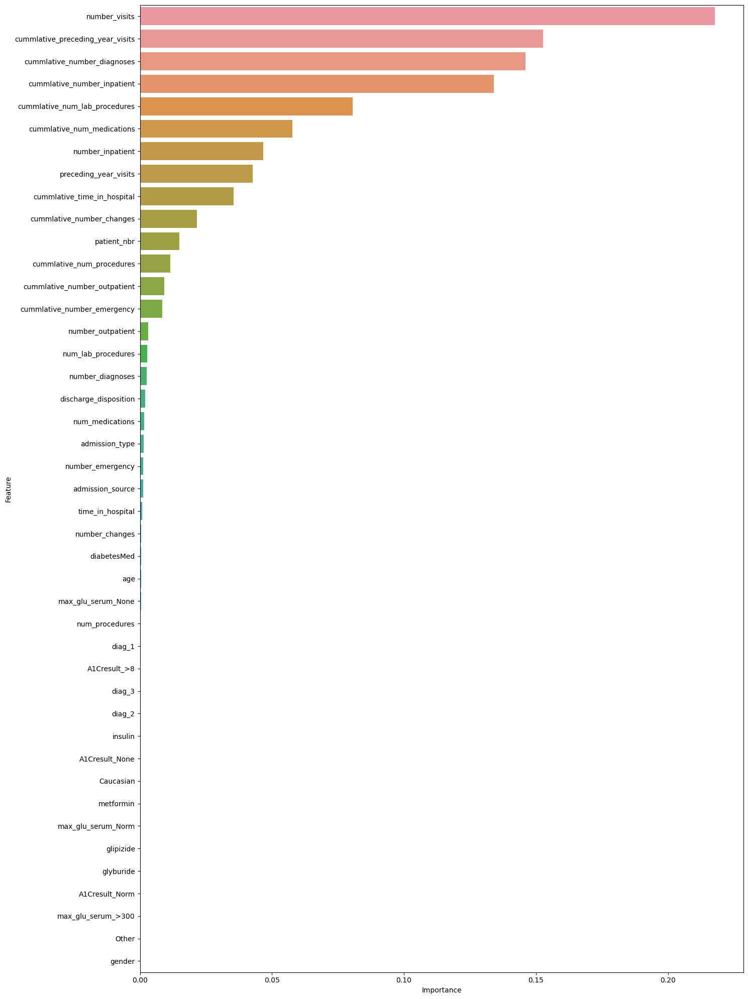

In [124]:
fig, ax = plt.subplots(figsize=(15, 20))

_ = sns.barplot(x=feature_importances_df['Importance'], y=feature_importances_df['Feature'])
plt.tight_layout()

In [125]:
pd.DataFrame({'Feature':X_train.columns,'Importance':randomForest_classifier.feature_importances_}).sort_values('Importance',ascending=False)[:20]

,Feature,Importance
24,number_visits,0.217719
33,cummlative_preceding_year_visits,0.152697
26,cummlative_number_diagnoses,0.146096
30,cummlative_number_inpatient,0.134072
29,cummlative_num_lab_procedures,0.080634
27,cummlative_num_medications,0.057661
9,number_inpatient,0.046650
22,preceding_year_visits,0.042786
25,cummlative_time_in_hospital,0.035541
34,cummlative_number_changes,0.021513


In [126]:
evaluation = pd.DataFrame({
                            'Model' : [model_name],
                            'Train' : [train_accuracy],
                            'Validation' : [validation_accuracy]
                          })
evaluation_df = pd.concat([evaluation_df, evaluation], ignore_index=True)

#### CatBoost

In [127]:
!pip install catboost

In [128]:
from catboost import Pool, CatBoostClassifier, cv
catboost_classifier = CatBoostClassifier(iterations=1000,eval_metric='Accuracy',learning_rate=0.1, use_best_model=True, random_seed=7, loss_function='MultiClass',l2_leaf_reg=3)
catboost_classifier.fit(X_train, y_train, eval_set=(X_validation, y_validation), verbose=100)

0:	learn: 0.7073068	test: 0.7099242	best: 0.7099242 (0)	total: 104ms	remaining: 1m 44s
100:	learn: 0.7310662	test: 0.7306289	best: 0.7307692 (99)	total: 3.37s	remaining: 30s
200:	learn: 0.7406647	test: 0.7337170	best: 0.7342785 (190)	total: 6.5s	remaining: 25.8s
300:	learn: 0.7474205	test: 0.7343487	best: 0.7346294 (272)	total: 9.53s	remaining: 22.1s
400:	learn: 0.7536323	test: 0.7356120	best: 0.7357524 (375)	total: 12.8s	remaining: 19.2s
500:	learn: 0.7587913	test: 0.7373666	best: 0.7375070 (473)	total: 15.9s	remaining: 15.9s
600:	learn: 0.7637573	test: 0.7379983	best: 0.7381387 (597)	total: 19.2s	remaining: 12.7s
700:	learn: 0.7689689	test: 0.7373666	best: 0.7384194 (611)	total: 22.3s	remaining: 9.52s
800:	learn: 0.7738120	test: 0.7368754	best: 0.7384194 (611)	total: 25.5s	remaining: 6.33s
900:	learn: 0.7785499	test: 0.7363139	best: 0.7384194 (611)	total: 28.7s	remaining: 3.15s
999:	learn: 0.7827086	test: 0.7357524	best: 0.7384194 (611)	total: 31.8s	remaining: 0us

bestTest = 0.73841

In [129]:
model_name = 'catboost'
models[model_name] = catboost_classifier

train_accuracy = catboost_classifier.score(X_train, y_train)
validation_accuracy = catboost_classifier.score(X_validation, y_validation)

print(f'The accuracy of {model_name} on the Training set is {train_accuracy}')
print(f'The accuracy of {model_name} on the Validation set is {validation_accuracy}')

The accuracy of catboost on the Training set is 0.7644942794974381
The accuracy of catboost on the Validation set is 0.7384194272880404


In [130]:
feature_importances_df = pd.DataFrame({'Feature':X_train.columns,'Importance':catboost_classifier.feature_importances_}).sort_values('Importance',ascending=False)
feature_importances_df.head()

,Feature,Importance
30,cummlative_number_inpatient,15.555025
9,number_inpatient,14.681615
24,number_visits,14.504505
0,patient_nbr,6.220079
33,cummlative_preceding_year_visits,5.637668


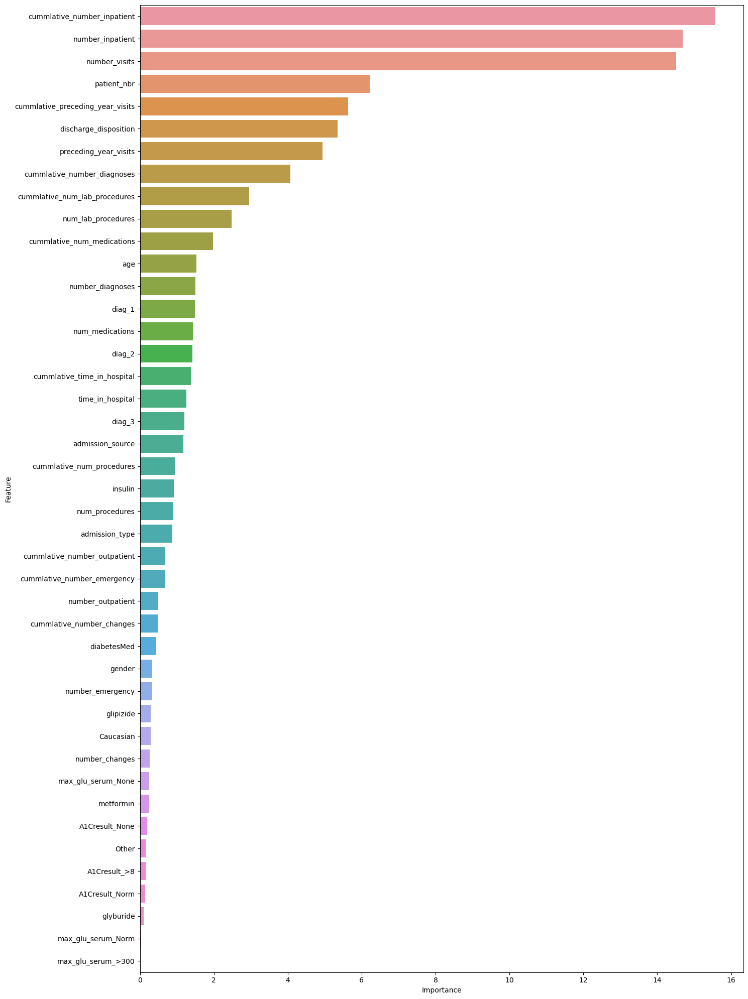

In [131]:
fig, ax = plt.subplots(figsize=(15, 20))

_ = sns.barplot(x=feature_importances_df['Importance'], y=feature_importances_df['Feature'])
plt.tight_layout()

In [132]:
evaluation = pd.DataFrame({
                            'Model' : [model_name],
                            'Train' : [train_accuracy],
                            'Validation' : [validation_accuracy]
                          })
evaluation_df = pd.concat([evaluation_df, evaluation], ignore_index=True)

#### Hist Gradient Boosting

In [133]:
from sklearn.ensemble import HistGradientBoostingClassifier
hist_classifier = HistGradientBoostingClassifier(max_iter=5000,random_state=7,l2_regularization=5)
hist_classifier.fit(X_train,y_train)

HistGradientBoostingClassifier(l2_regularization=5, max_iter=5000,
                               random_state=7)

In [134]:
model_name = 'HistGradient'
models[model_name] = hist_classifier

train_accuracy = hist_classifier.score(X_train, y_train)
validation_accuracy = hist_classifier.score(X_validation, y_validation)

print(f'The accuracy of {model_name} on the Training set is {train_accuracy}')
print(f'The accuracy of {model_name} on the Validation set is {validation_accuracy}')

The accuracy of HistGradient on the Training set is 0.7668105566084088
The accuracy of HistGradient on the Validation set is 0.7375070185289163


In [135]:
evaluation = pd.DataFrame({
                            'Model' : [model_name],
                            'Train' : [train_accuracy],
                            'Validation' : [validation_accuracy]
                          })
evaluation_df = pd.concat([evaluation_df, evaluation], ignore_index=True)

#### Light GBM

In [136]:
import lightgbm as lgb
lgb_classifier = lgb.LGBMClassifier(n_estimators=200,random_state=7,reg_lambda=7,)
lgb_classifier.fit(X_train.values, y_train.values)

LGBMClassifier(n_estimators=200, random_state=7, reg_lambda=7)

In [137]:
model_name = 'lightgbm'
models[model_name] = lgb_classifier

train_accuracy = lgb_classifier.score(X_train.values, y_train.values)
validation_accuracy = lgb_classifier.score(X_validation.values, y_validation.values)

print(f'The accuracy of {model_name} on the Training set is {train_accuracy}')
print(f'The accuracy of {model_name} on the Validation set is {validation_accuracy}')

The accuracy of lightgbm on the Training set is 0.7790061065487471
The accuracy of lightgbm on the Validation set is 0.7378579449747333


In [138]:
feature_importances_df = pd.DataFrame({'Feature':X_train.columns,'Importance':lgb_classifier.feature_importances_}).sort_values('Importance',ascending=False)
feature_importances_df.head()

,Feature,Importance
0,patient_nbr,2080
4,num_lab_procedures,1299
29,cummlative_num_lab_procedures,1062
6,num_medications,966
27,cummlative_num_medications,943


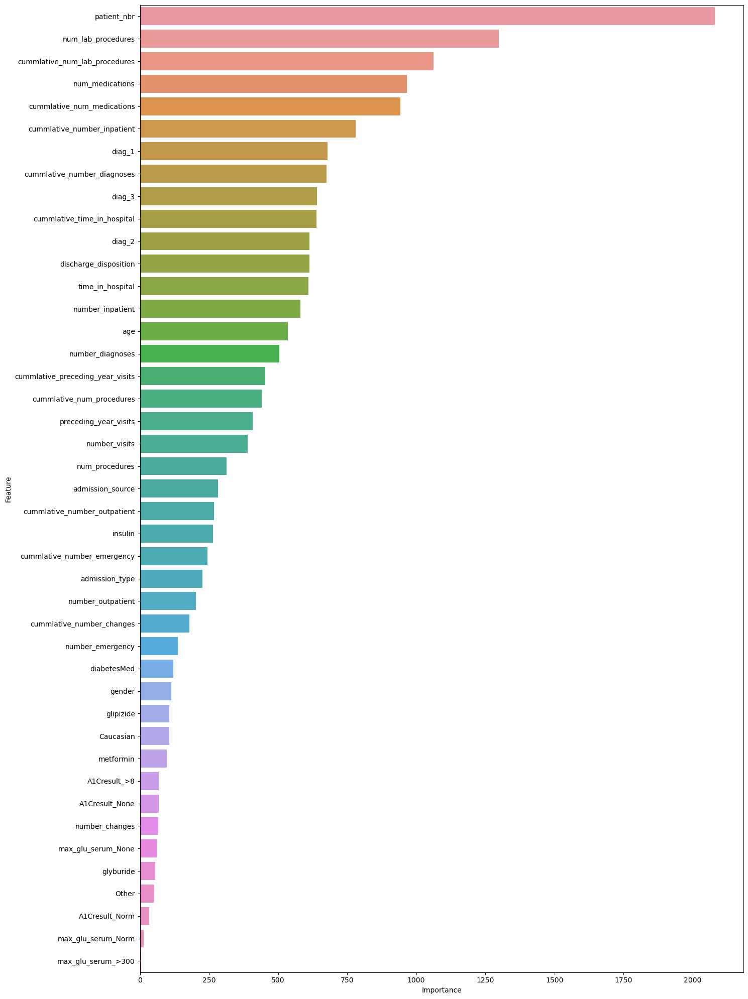

In [139]:
fig, ax = plt.subplots(figsize=(15, 20))

_ = sns.barplot(x=feature_importances_df['Importance'], y=feature_importances_df['Feature'])
plt.tight_layout()

In [140]:
evaluation = pd.DataFrame({
                            'Model' : [model_name],
                            'Train' : [train_accuracy],
                            'Validation' : [validation_accuracy]
                          })
evaluation_df = pd.concat([evaluation_df, evaluation], ignore_index=True)

#### XGBoost

In [141]:
import xgboost
from xgboost import XGBClassifier

# Create an instance of the classifier
xgb_classifier = XGBClassifier(max_depth=5, random_state=0)

# Train the classifier
xgb_classifier.fit(X_train, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=5, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, objective='multi:softprob',
              predictor='auto', random_state=0, reg_alpha=0, ...)

In [142]:
model_name = 'xgboost'
models[model_name] = xgb_classifier

train_accuracy = xgb_classifier.score(X_train, y_train)
validation_accuracy = xgb_classifier.score(X_validation, y_validation)

print(f'The accuracy of {model_name} on the Training set is {train_accuracy}')
print(f'The accuracy of {model_name} on the Validation set is {validation_accuracy}')

The accuracy of xgboost on the Training set is 0.7734961746332562
The accuracy of xgboost on the Validation set is 0.7369455362156092


In [143]:
feature_importances_df = pd.DataFrame({'Feature':X_train.columns,'Importance':xgb_classifier.feature_importances_}).sort_values('Importance',ascending=False)
feature_importances_df.head()

,Feature,Importance
24,number_visits,0.382978
30,cummlative_number_inpatient,0.135556
9,number_inpatient,0.090712
22,preceding_year_visits,0.033169
20,discharge_disposition,0.027780


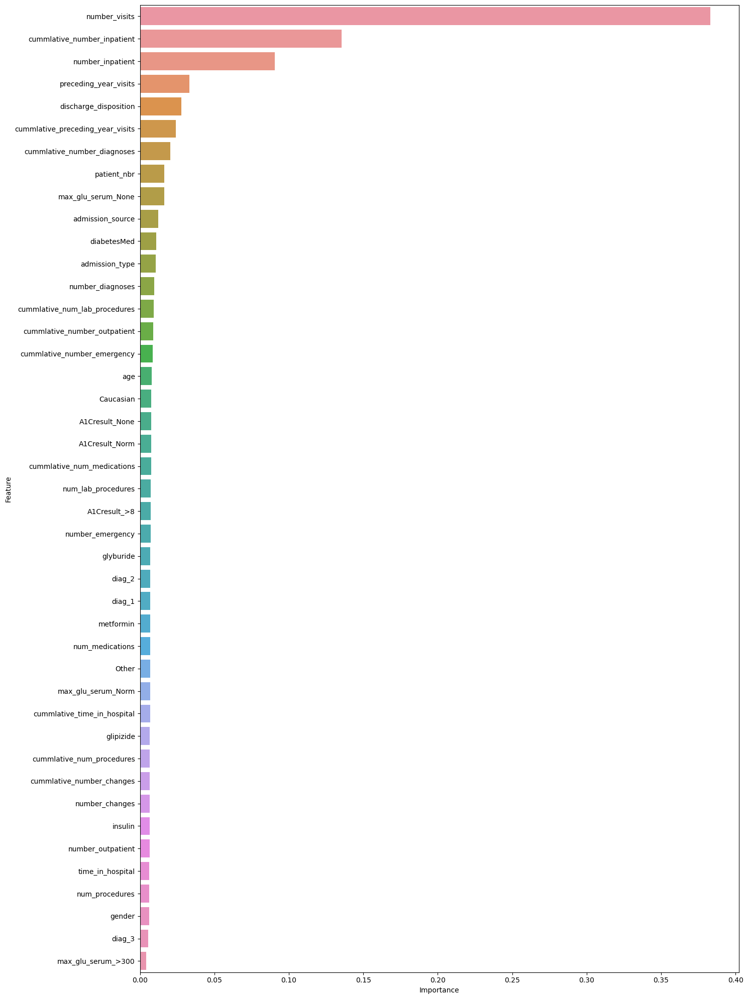

In [144]:
fig, ax = plt.subplots(figsize=(15, 20))

_ = sns.barplot(x=feature_importances_df['Importance'], y=feature_importances_df['Feature'])
plt.tight_layout()

In [145]:
evaluation = pd.DataFrame({
                            'Model' : [model_name],
                            'Train' : [train_accuracy],
                            'Validation' : [validation_accuracy]
                          })
evaluation_df = pd.concat([evaluation_df, evaluation], ignore_index=True)

#### Logistic Regression

In [146]:
# from sklearn.linear_model import LogisticRegression
# logistic_classifier = LogisticRegression()
# logistic_classifier.fit(X_train, y_train)

In [147]:
# model_name = 'LogisticRegression'
# models[model_name] = logistic_classifier

# train_accuracy = logistic_classifier.score(X_train, y_train)
# validation_accuracy = logistic_classifier.score(X_validation, y_validation)

# print(f'The accuracy of {model_name} on the Training set is {train_accuracy}')
# print(f'The accuracy of {model_name} on the Validation set is {validation_accuracy}')

In [148]:
# feature_importances_df = pd.DataFrame({'Feature':X_train.columns,'Importance':logistic_classifier.feature_importances_}).sort_values('Importance',ascending=False)
# feature_importances_df.head()

In [149]:
# fig, ax = plt.subplots(figsize=(15, 20))

# _ = sns.barplot(x=feature_importances_df['Importance'], y=feature_importances_df['Feature'])
# plt.tight_layout()

In [150]:
# evaluation = pd.DataFrame({
#                             'Model' : [model_name],
#                             'Train' : [train_accuracy],
#                             'Validation' : [validation_accuracy]
#                           })
# evaluation_df = pd.concat([evaluation_df, evaluation], ignore_index=True)

#### Decision Tree

In [151]:
# from sklearn.tree import DecisionTreeClassifier
# dt_classifier = DecisionTreeClassifier()
# dt_classifier.fit(X_train, y_train)

# print("The accuracy of the classifier on the Training set is ", (dt_classifier.score(X_train, y_train)))
# print("The accuracy of the classifier on the validation set is ", (dt_classifier.score(X_validation, y_validation)))

In [152]:
# model_name = 'DecisionTree'
# models[model_name] = dt_classifier

# train_accuracy = dt_classifier.score(X_train, y_train)
# validation_accuracy = dt_classifier.score(X_validation, y_validation)

# print(f'The accuracy of {model_name} on the Training set is {train_accuracy}')
# print(f'The accuracy of {model_name} on the Validation set is {validation_accuracy}')

In [153]:
# feature_importances_df = pd.DataFrame({'Feature':X_train.columns,'Importance':dt_classifier.feature_importances_}).sort_values('Importance',ascending=False)
# feature_importances_df.head()

In [154]:
# fig, ax = plt.subplots(figsize=(15, 20))

# _ = sns.barplot(x=feature_importances_df['Importance'], y=feature_importances_df['Feature'])
# plt.tight_layout()

In [155]:
# evaluation = pd.DataFrame({
#                             'Model' : [model_name],
#                             'Train' : [train_accuracy],
#                             'Validation' : [validation_accuracy]
#                           })
# evaluation_df = pd.concat([evaluation_df, evaluation], ignore_index=True)

#### KNN

In [156]:
# from sklearn.neighbors import KNeighborsClassifier
# knn_classifier = KNeighborsClassifier()
# knn_classifier.fit(X_train, y_train)

In [157]:
# model_name = 'KNeighbors'
# models[model_name] = knn_classifier

# train_accuracy = knn_classifier.score(X_train, y_train)
# validation_accuracy = knn_classifier.score(X_validation, y_validation)

# print(f'The accuracy of {model_name} on the Training set is {train_accuracy}')
# print(f'The accuracy of {model_name} on the Validation set is {validation_accuracy}')

In [158]:
# feature_importances_df = pd.DataFrame({'Feature':X_train.columns,'Importance':knn_classifier.feature_importances_}).sort_values('Importance',ascending=False)
# feature_importances_df.head()

In [159]:
# fig, ax = plt.subplots(figsize=(15, 20))

# _ = sns.barplot(x=feature_importances_df['Importance'], y=feature_importances_df['Feature'])
# plt.tight_layout()

In [160]:
# evaluation = pd.DataFrame({
#                             'Model' : [model_name],
#                             'Train' : [train_accuracy],
#                             'Validation' : [validation_accuracy]
#                           })
# evaluation_df = pd.concat([evaluation_df, evaluation], ignore_index=True)

#### Gaussian

In [161]:
# from sklearn.naive_bayes import GaussianNB
# gnb_classifier = GaussianNB()
# gnb_classifier.fit(X_train, y_train)

In [162]:
# model_name = 'GaussianNB'
# models[model_name] = gnb_classifier

# train_accuracy = gnb_classifier.score(X_train, y_train)
# validation_accuracy = gnb_classifier.score(X_validation, y_validation)

# print(f'The accuracy of {model_name} on the Training set is {train_accuracy}')
# print(f'The accuracy of {model_name} on the Validation set is {validation_accuracy}')

In [163]:
# feature_importances_df = pd.DataFrame({'Feature':X_train.columns,'Importance':gnb_classifier.feature_importances_}).sort_values('Importance',ascending=False)
# feature_importances_df.head()

In [164]:
# fig, ax = plt.subplots(figsize=(15, 20))

# _ = sns.barplot(x=feature_importances_df['Importance'], y=feature_importances_df['Feature'])
# plt.tight_layout()

In [165]:
# evaluation = pd.DataFrame({
#                             'Model' : [model_name],
#                             'Train' : [train_accuracy],
#                             'Validation' : [validation_accuracy]
#                           })
# evaluation_df = pd.concat([evaluation_df, evaluation], ignore_index=True)

### Evaluation

In [166]:
evaluation_df

,Model,Train,Validation
0,Random Forest,0.710202,0.713574
1,catboost,0.764494,0.738419
2,HistGradient,0.766811,0.737507
3,lightgbm,0.779006,0.737858
4,xgboost,0.773496,0.736946


In [167]:
# Get best model according to validation score
best_model = evaluation_df[evaluation_df['Validation'] == evaluation_df['Validation'].max()]['Model'].values[0]
classifier = models[best_model]
classifier

## Submission File Generation

In [168]:
X_test = test_df.drop(columns=to_drop_features[0])

y_test_predicted_encoded = classifier.predict(X_test)

y_test_predicted = label_encoder.inverse_transform(y_test_predicted_encoded)

test_df['readmitted'] = y_test_predicted

test_df.head()

/opt/conda/lib/python3.7/site-packages/sklearn/preprocessing/_label.py:154: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


,encounter_id,patient_nbr,gender,age,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,...,cummlative_number_changes,Caucasian,Other,max_glu_serum_>300,max_glu_serum_None,max_glu_serum_Norm,A1Cresult_>8,A1Cresult_None,A1Cresult_Norm,readmitted
0,109962834,23779836,0,0.0,0.00,0.076923,0.0,1.1,0.0,0.0,...,0.0,0,0,0,1,0,0,1,0,>30
1,240829854,32387580,1,1.0,-0.25,-0.076923,-0.5,-0.3,0.0,0.0,...,0.0,1,0,0,1,0,0,1,0,NO
2,44942994,19436418,0,-2.0,0.00,1.038462,1.0,0.5,0.0,0.0,...,0.0,1,0,0,1,0,0,1,0,NO
3,302469824,142233539,0,0.0,0.75,1.346154,0.0,-0.2,0.0,0.0,...,0.0,0,0,0,1,0,0,1,0,NO
4,172075704,79818876,1,0.0,0.75,-0.423077,0.5,2.2,0.0,0.0,...,0.0,1,0,0,1,0,0,1,0,<30


In [169]:
test_df[['encounter_id', 'readmitted']].to_csv('/kaggle/working/submission.csv', index=False)
# test_df[['encounter_id', 'readmitted']].to_csv('/content/submission.csv', index=False)

In [170]:
del test_df['readmitted']